### Student Information
Name: Wen-Chao Yeh 葉文照

Student ID: 109065801

GitHub ID: windyeh

---

### Instructions

1. First: do the **take home** exercises in the [SNHCC-DM2020-Lab2-Master Repo](https://github.com/fhcalderon87/SNHCC-DM2020-Lab2-Master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [SNHCC-DM2020-Lab2-Master Repo](https://github.com/fhcalderon87/SNHCC-DM2020-Lab2-Master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


Upload your solution notebook to your Github repository  and send a link with allowed access to my email: fhcalderon87@gmail.com __BEFORE the deadline (Dec. 14th 11:59 pm, Monday)__. 

## Table of Contents
### [part 1: take home exercises in the SNHCC-DM2020-Lab2-Master Repo](#Part-1:-take-home-exercises-in-the-SNHCC-DM2020-Lab2-Master-Repo)

### [part 2: New Dataset](#Part-2:-New-Dataset)

### [part 3: New tasks on the new dataset](#Part-3:-New-tasks-on-the-new-dataset)

### part 4: improve the Data preprocessing for these specific datasets, please find it by previous parts.

**yes, I modify some coding at some cells, when you go through whole notebook will find out. especially, the term frequency matrix is a big sparse array and sum each term counting will consume much time. so I prefer to use transpose matrix.**

### part 5: implement at previous parts.

**I believe you can find this notebook is tidy up well**

# Part 1: take home exercises in the SNHCC-DM2020-Lab2-Master Repo
#### **<font color=blue>For tidy up and run programs smoothly, please allow me to put whole lab notebook but not just take home exercises cell only.</font>**

## 1. The Data
In this notebook we will explore the popular 20 newsgroup dataset, originally provided [here](http://qwone.com/~jason/20Newsgroups/). The dataset is called "Twenty Newsgroups", which means there are 20 categories of news articles available in the entire dataset. A short description of the dataset, provided by the authors, is provided below:

- *The 20 Newsgroups data set is a collection of approximately 20,000 newsgroup documents, partitioned (nearly) evenly across 20 different newsgroups. To the best of our knowledge, it was originally collected by Ken Lang, probably for his paper “Newsweeder: Learning to filter netnews,” though he does not explicitly mention this collection. The 20 newsgroups collection has become a popular data set for experiments in text applications of machine learning techniques, such as text classification and text clustering.*

If you need more information about the dataset please refer to the reference provided above. Below is a snapshot of the dataset already converted into a table. Keep in mind that the original dataset is not in this nice pretty format. That work is left to us. That is one of the tasks that will be covered in this notebook: how to convert raw data into convenient tabular formats using Pandas. 

![atl txt](https://docs.google.com/drawings/d/e/2PACX-1vRd845nNXa1x1Enw6IoEbg-05lB19xG3mfO2BjnpZrloT0pSnY89stBV1gS9Iu6cgRCTq3E5giIT5ZI/pub?w=835&h=550)

---

## 2. Data Preparation
Now let us begin to explore the data. The original dataset can be found on the link provided above or you can directly use the version provided by scikit learn. Here we will use the scikit learn version. 

In this demonstration we are only going to look at 4 categories. This means we will not make use of the complete dataset, but only a subset of it, which includes the 4 categories defined below:

In [1]:
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

In [2]:
# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories, \
                                  shuffle=True, random_state=42)

In [3]:
# figure out what kinds of data be included?
list(twenty_train)

['data', 'filenames', 'target_names', 'target', 'DESCR']

Let's take at look some of the records that are contained in our subset of the data

In [4]:
twenty_train.data[0:2]

['From: sd345@city.ac.uk (Michael Collier)\nSubject: Converting images to HP LaserJet III?\nNntp-Posting-Host: hampton\nOrganization: The City University\nLines: 14\n\nDoes anyone know of a good way (standard PC application/PD utility) to\nconvert tif/img/tga files into LaserJet III format.  We would also like to\ndo the same, converting to HPGL (HP plotter) files.\n\nPlease email any response.\n\nIs this the correct group?\n\nThanks in advance.  Michael.\n-- \nMichael Collier (Programmer)                 The Computer Unit,\nEmail: M.P.Collier@uk.ac.city                The City University,\nTel: 071 477-8000 x3769                      London,\nFax: 071 477-8565                            EC1V 0HB.\n',
 "From: ani@ms.uky.edu (Aniruddha B. Deglurkar)\nSubject: help: Splitting a trimming region along a mesh \nOrganization: University Of Kentucky, Dept. of Math Sciences\nLines: 28\n\n\n\n\tHi,\n\n\tI have a problem, I hope some of the 'gurus' can help me solve.\n\n\tBackground of the probl

**Note** the `twenty_train` is just a bunch of objects that can be accessed as python dictionaries; so, you can do the following operations on `twenty_train`

In [5]:
twenty_train.target_names

['alt.atheism', 'comp.graphics', 'sci.med', 'soc.religion.christian']

In [6]:
len(twenty_train.data)

2257

In [7]:
len(twenty_train.filenames)

2257

#### We can also print an example from the subset

In [8]:
type(twenty_train.data[0])

str

In [9]:
# An example of what the subset contains
# print("\n".join(twenty_train.data[0].split("\n")))

# since the type of a data element is str, we just print() f-string is ok.
print(f'{twenty_train.data[0]}')

From: sd345@city.ac.uk (Michael Collier)
Subject: Converting images to HP LaserJet III?
Nntp-Posting-Host: hampton
Organization: The City University
Lines: 14

Does anyone know of a good way (standard PC application/PD utility) to
convert tif/img/tga files into LaserJet III format.  We would also like to
do the same, converting to HPGL (HP plotter) files.

Please email any response.

Is this the correct group?

Thanks in advance.  Michael.
-- 
Michael Collier (Programmer)                 The Computer Unit,
Email: M.P.Collier@uk.ac.city                The City University,
Tel: 071 477-8000 x3769                      London,
Fax: 071 477-8565                            EC1V 0HB.



... and determine the label of the example via `target_names` key value

In [10]:
print(twenty_train.target_names[twenty_train.target[0]])

comp.graphics


In [11]:
twenty_train.target[0]

1

... we can also get the category of 10 documents via `target` key value 

In [12]:
# category of first 10 documents.
twenty_train.target[:10]

array([1, 1, 3, 3, 3, 3, 3, 2, 2, 2])

**Note:** As you can observe, both approaches above provide two different ways of obtaining the `category` value for the dataset. Ideally, we want to have access to both types -- numerical and nominal -- in the event some particular library favors a particular type. 

As you may have already noticed as well, there is no **tabular format** for the current version of the data. As data miners, we are interested in having our dataset in the most convenient format as possible; something we can manipulate easily and is compatible with our algorithms, and so forth.

Here is one way to get access to the *text* version of the label of a subset of our training data:

In [13]:
for t in twenty_train.target[:10]:
    print(twenty_train.target_names[t])

comp.graphics
comp.graphics
soc.religion.christian
soc.religion.christian
soc.religion.christian
soc.religion.christian
soc.religion.christian
sci.med
sci.med
sci.med


---

### ** >>> Exercise 1 (5 min): **  
In this exercise, please print out the *text* data for the first three samples in the dataset. (See the above code for help)

In [14]:
# Answer here

for item in twenty_train.data[:3]:
    print(item)
    

From: sd345@city.ac.uk (Michael Collier)
Subject: Converting images to HP LaserJet III?
Nntp-Posting-Host: hampton
Organization: The City University
Lines: 14

Does anyone know of a good way (standard PC application/PD utility) to
convert tif/img/tga files into LaserJet III format.  We would also like to
do the same, converting to HPGL (HP plotter) files.

Please email any response.

Is this the correct group?

Thanks in advance.  Michael.
-- 
Michael Collier (Programmer)                 The Computer Unit,
Email: M.P.Collier@uk.ac.city                The City University,
Tel: 071 477-8000 x3769                      London,
Fax: 071 477-8565                            EC1V 0HB.

From: ani@ms.uky.edu (Aniruddha B. Deglurkar)
Subject: help: Splitting a trimming region along a mesh 
Organization: University Of Kentucky, Dept. of Math Sciences
Lines: 28



	Hi,

	I have a problem, I hope some of the 'gurus' can help me solve.

	Background of the problem:
	I have a rectangular mesh in the uv

---

## 3. Data Transformation
So we want to explore and understand our data a little bit better. Before we do that we definitely need to apply some transformations just so we can have our dataset in a nice format to be able to explore it freely and more efficient. Lucky for us, there are powerful scientific tools to transform our data into that tabular format we are so farmiliar with. So that is what we will do in the next section--transform our data into a nice table format.

---

### 3.1 Converting Dictionary into Pandas Dataframe
Here we will show you how to convert dictionary objects into a pandas dataframe. And by the way, a pandas dataframe is nothing more than a table magically stored for efficient information retrieval.

In [15]:
twenty_train.data[0:2]

['From: sd345@city.ac.uk (Michael Collier)\nSubject: Converting images to HP LaserJet III?\nNntp-Posting-Host: hampton\nOrganization: The City University\nLines: 14\n\nDoes anyone know of a good way (standard PC application/PD utility) to\nconvert tif/img/tga files into LaserJet III format.  We would also like to\ndo the same, converting to HPGL (HP plotter) files.\n\nPlease email any response.\n\nIs this the correct group?\n\nThanks in advance.  Michael.\n-- \nMichael Collier (Programmer)                 The Computer Unit,\nEmail: M.P.Collier@uk.ac.city                The City University,\nTel: 071 477-8000 x3769                      London,\nFax: 071 477-8565                            EC1V 0HB.\n',
 "From: ani@ms.uky.edu (Aniruddha B. Deglurkar)\nSubject: help: Splitting a trimming region along a mesh \nOrganization: University Of Kentucky, Dept. of Math Sciences\nLines: 28\n\n\n\n\tHi,\n\n\tI have a problem, I hope some of the 'gurus' can help me solve.\n\n\tBackground of the probl

In [16]:
twenty_train.target

array([1, 1, 3, ..., 2, 2, 2])

In [17]:
import pandas as pd
import numpy as np

# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
#X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

In [18]:
# try list comprehension
X = pd.DataFrame([item.replace("\n", " ").strip("\n\t") for item in twenty_train.data], columns=["text"])

In [19]:
# deep copy X dataframe for later compare
X_copy = X.copy(deep=True)

In [20]:
X.head()

,text
0,From: sd345@city.ac.uk (Michael Collier) Subje...
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...
4,From: stanly@grok11.columbiasc.ncr.com (stanly...


In [21]:
len(X)

2257

In [22]:
X[0:2]

,text
0,From: sd345@city.ac.uk (Michael Collier) Subje...
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...


In [23]:
for t in X["text"][:3]:
    print(t)

From: sd345@city.ac.uk (Michael Collier) Subject: Converting images to HP LaserJet III? Nntp-Posting-Host: hampton Organization: The City University Lines: 14  Does anyone know of a good way (standard PC application/PD utility) to convert tif/img/tga files into LaserJet III format.  We would also like to do the same, converting to HPGL (HP plotter) files.  Please email any response.  Is this the correct group?  Thanks in advance.  Michael. --  Michael Collier (Programmer)                 The Computer Unit, Email: M.P.Collier@uk.ac.city                The City University, Tel: 071 477-8000 x3769                      London, Fax: 071 477-8565                            EC1V 0HB. 
From: ani@ms.uky.edu (Aniruddha B. Deglurkar) Subject: help: Splitting a trimming region along a mesh  Organization: University Of Kentucky, Dept. of Math Sciences Lines: 28    	Hi,  	I have a problem, I hope some of the 'gurus' can help me solve.  	Background of the problem: 	I have a rectangular mesh in the uv

### Adding Columns

One of the great advantages of a pandas dataframe is its flexibility. We can add columns to the current dataset programmatically with very little effort.

In [24]:
# add category to the dataframe
X['category'] = twenty_train.target

In [25]:
# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

Now we can print and see what our table looks like. 

In [26]:
X[0:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


Nice! Isn't it? With this format we can conduct many operations easily and efficiently since Pandas dataframes provide us with a wide range of built-in features/functionalities. These features are operations which can directly and quickly be applied to the dataset. These operations may include standard operations like **removing records with missing values** and **aggregating new fields** to the current table (hereinafter referred to as a dataframe), which is desirable in almost every data mining project. Go Pandas!

---

### 3.2 Familiarizing yourself with the Data

To begin to show you the awesomeness of Pandas dataframes, let us look at how to run a simple query on our dataset. We want to query for the first 10 rows (documents), and we only want to keep the `text` and `category_name` attributes or fields.

In [27]:
# a simple query
X[0:10][["text", "category_name"]]

,text,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,sci.med


Let us look at a few more interesting queries to familiarize ourselves with the efficiency and conveniency of Pandas dataframes.

#### Let's query the last 10 records

Ready for some sourcery? Brace yourselves! Let us see if we can query every 10th record in our dataframe. In addition, our query must only contain the first 10 records. For this we will use the build-in function called `iloc`. This allows us to query a selection of our dataset by position. 

In [28]:
# using iloc (by position)
X.iloc[::10, 0:2][0:10]

,text,category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1
10,From: anasaz!karl@anasazi.com (Karl Dussik) Su...,3
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,3
30,From: vgwlu@dunsell.calgary.chevron.com (greg ...,2
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3
50,From: ab@nova.cc.purdue.edu (Allen B) Subject:...,1
60,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0
70,From: weaver@chdasic.sps.mot.com (Dave Weaver)...,3
80,From: annick@cortex.physiol.su.oz.au (Annick A...,2
90,Subject: Vonnegut/atheism From: dmn@kepler.unh...,0


You can also use the `loc` function to explicity define the columns you want to query. Take a look at this [great discussion](https://stackoverflow.com/questions/28757389/pandas-loc-vs-iloc-vs-ix-vs-at-vs-iat/43968774) on the differences between the `iloc` and `loc` functions.

In [29]:
# using loc (by label)
X.loc[::10, 'text'][0:10]

0     From: sd345@city.ac.uk (Michael Collier) Subje...
10    From: anasaz!karl@anasazi.com (Karl Dussik) Su...
20    From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...
30    From: vgwlu@dunsell.calgary.chevron.com (greg ...
40    From: david-s@hsr.no (David A. Sjoen) Subject:...
50    From: ab@nova.cc.purdue.edu (Allen B) Subject:...
60    From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...
70    From: weaver@chdasic.sps.mot.com (Dave Weaver)...
80    From: annick@cortex.physiol.su.oz.au (Annick A...
90    Subject: Vonnegut/atheism From: dmn@kepler.unh...
Name: text, dtype: object

In [30]:
# standard query (Cannot simultaneously select rows and columns)
X[::10][0:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
10,From: anasaz!karl@anasazi.com (Karl Dussik) Su...,3,soc.religion.christian
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,3,soc.religion.christian
30,From: vgwlu@dunsell.calgary.chevron.com (greg ...,2,sci.med
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3,soc.religion.christian
50,From: ab@nova.cc.purdue.edu (Allen B) Subject:...,1,comp.graphics
60,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0,alt.atheism
70,From: weaver@chdasic.sps.mot.com (Dave Weaver)...,3,soc.religion.christian
80,From: annick@cortex.physiol.su.oz.au (Annick A...,2,sci.med
90,Subject: Vonnegut/atheism From: dmn@kepler.unh...,0,alt.atheism


### ** >>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

#### Attribute access

In [31]:
X.text[::10][:10]

0     From: sd345@city.ac.uk (Michael Collier) Subje...
10    From: anasaz!karl@anasazi.com (Karl Dussik) Su...
20    From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...
30    From: vgwlu@dunsell.calgary.chevron.com (greg ...
40    From: david-s@hsr.no (David A. Sjoen) Subject:...
50    From: ab@nova.cc.purdue.edu (Allen B) Subject:...
60    From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...
70    From: weaver@chdasic.sps.mot.com (Dave Weaver)...
80    From: annick@cortex.physiol.su.oz.au (Annick A...
90    Subject: Vonnegut/atheism From: dmn@kepler.unh...
Name: text, dtype: object

#### selection by *position*

In [32]:
# using iloc (by position). We can select columns want, then make selection.
X.iloc[:, :2][::10][:10]

,text,category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1
10,From: anasaz!karl@anasazi.com (Karl Dussik) Su...,3
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,3
30,From: vgwlu@dunsell.calgary.chevron.com (greg ...,2
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3
50,From: ab@nova.cc.purdue.edu (Allen B) Subject:...,1
60,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0
70,From: weaver@chdasic.sps.mot.com (Dave Weaver)...,3
80,From: annick@cortex.physiol.su.oz.au (Annick A...,2
90,Subject: Vonnegut/atheism From: dmn@kepler.unh...,0


#### selection by *label*

In [33]:
# using loc (by label), We can select whole column, then make selection.
X.loc[:, 'text'][::10][:10]

0     From: sd345@city.ac.uk (Michael Collier) Subje...
10    From: anasaz!karl@anasazi.com (Karl Dussik) Su...
20    From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...
30    From: vgwlu@dunsell.calgary.chevron.com (greg ...
40    From: david-s@hsr.no (David A. Sjoen) Subject:...
50    From: ab@nova.cc.purdue.edu (Allen B) Subject:...
60    From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...
70    From: weaver@chdasic.sps.mot.com (Dave Weaver)...
80    From: annick@cortex.physiol.su.oz.au (Annick A...
90    Subject: Vonnegut/atheism From: dmn@kepler.unh...
Name: text, dtype: object

#### selection by *index*

In [34]:
X["text"][::10][:10]

0     From: sd345@city.ac.uk (Michael Collier) Subje...
10    From: anasaz!karl@anasazi.com (Karl Dussik) Su...
20    From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...
30    From: vgwlu@dunsell.calgary.chevron.com (greg ...
40    From: david-s@hsr.no (David A. Sjoen) Subject:...
50    From: ab@nova.cc.purdue.edu (Allen B) Subject:...
60    From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...
70    From: weaver@chdasic.sps.mot.com (Dave Weaver)...
80    From: annick@cortex.physiol.su.oz.au (Annick A...
90    Subject: Vonnegut/atheism From: dmn@kepler.unh...
Name: text, dtype: object

In [35]:
X[::10][:10]["text"]

0     From: sd345@city.ac.uk (Michael Collier) Subje...
10    From: anasaz!karl@anasazi.com (Karl Dussik) Su...
20    From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...
30    From: vgwlu@dunsell.calgary.chevron.com (greg ...
40    From: david-s@hsr.no (David A. Sjoen) Subject:...
50    From: ab@nova.cc.purdue.edu (Allen B) Subject:...
60    From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...
70    From: weaver@chdasic.sps.mot.com (Dave Weaver)...
80    From: annick@cortex.physiol.su.oz.au (Annick A...
90    Subject: Vonnegut/atheism From: dmn@kepler.unh...
Name: text, dtype: object

#### Selection by callable

In [36]:
X[lambda X: X["text"].index%10 == 0][:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
10,From: anasaz!karl@anasazi.com (Karl Dussik) Su...,3,soc.religion.christian
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,3,soc.religion.christian
30,From: vgwlu@dunsell.calgary.chevron.com (greg ...,2,sci.med
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3,soc.religion.christian
50,From: ab@nova.cc.purdue.edu (Allen B) Subject:...,1,comp.graphics
60,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0,alt.atheism
70,From: weaver@chdasic.sps.mot.com (Dave Weaver)...,3,soc.religion.christian
80,From: annick@cortex.physiol.su.oz.au (Annick A...,2,sci.med
90,Subject: Vonnegut/atheism From: dmn@kepler.unh...,0,alt.atheism


#### Fast scalar value getting and setting

In [37]:
X.at[10, "text"]

'From: anasaz!karl@anasazi.com (Karl Dussik) Subject: Re: Is "Christian" a dirty word? Organization: Anasazi Inc Phx Az USA Lines: 73  In article <Mar.25.03.53.08.1993.24855@athos.rutgers.edu> @usceast.cs.scarolina.edu:moss@cs.scarolina.edu (James Moss) writes: >I was brought up christian, but I am not christian any longer. >I also have a bad taste in my mouth over christianity.  I (in >my own faith) accept and live my life by many if not most of the >teachings of christ, but I cannot let myself be called a christian, >beacuse to me too many things are done on the name of christianity, >that I can not be associated with.    A question for you - can you give me the name of an organization or a philosophy or a political movement, etc., which has never had anything evil done in its name?  You\'re missing a central teaching of Christianity - man is inherently sinful.  We are saved through faith by grace.  Knowing that, believing that, does not make us without sin.  Furthermore, not all who

In [38]:
X.iat[10, 0]

'From: anasaz!karl@anasazi.com (Karl Dussik) Subject: Re: Is "Christian" a dirty word? Organization: Anasazi Inc Phx Az USA Lines: 73  In article <Mar.25.03.53.08.1993.24855@athos.rutgers.edu> @usceast.cs.scarolina.edu:moss@cs.scarolina.edu (James Moss) writes: >I was brought up christian, but I am not christian any longer. >I also have a bad taste in my mouth over christianity.  I (in >my own faith) accept and live my life by many if not most of the >teachings of christ, but I cannot let myself be called a christian, >beacuse to me too many things are done on the name of christianity, >that I can not be associated with.    A question for you - can you give me the name of an organization or a philosophy or a political movement, etc., which has never had anything evil done in its name?  You\'re missing a central teaching of Christianity - man is inherently sinful.  We are saved through faith by grace.  Knowing that, believing that, does not make us without sin.  Furthermore, not all who

#### Boolean indexing

In [39]:
X[X["category"] == 0]

,text,category,category_name
12,From: I3150101@dbstu1.rz.tu-bs.de (Benedikt Ro...,0,alt.atheism
13,Subject: So what is Maddi? From: madhaus@netco...,0,alt.atheism
17,Organization: Penn State University From: <JSN...,0,alt.atheism
19,Subject: Re: Don't more innocents die without ...,0,alt.atheism
21,From: gmiller@worldbank.org (Gene C. Miller) S...,0,alt.atheism
...,...,...,...
2231,"Subject: Re: Feminism and Islam, again From: k...",0,alt.atheism
2233,From: kmr4@po.CWRU.edu (Keith M. Ryan) Subject...,0,alt.atheism
2234,From: David.Rice@ofa123.fidonet.org Subject: i...,0,alt.atheism
2237,From: datepper@phoenix.Princeton.EDU (David Aa...,0,alt.atheism


In [40]:
X[[len(item) > 50000 for item in X["text"]]]

,text,category,category_name
400,From: nfotis@ntua.gr (Nick C. Fotis) Subject: ...,1,comp.graphics
433,From: tgl+@cs.cmu.edu (Tom Lane) Subject: JPEG...,1,comp.graphics
1403,From: bobbe@vice.ICO.TEK.COM (Robert Beauchain...,0,alt.atheism
1890,From: nfotis@ntua.gr (Nick C. Fotis) Subject: ...,1,comp.graphics


#### Indexing with isin

In [41]:
X.category[X.category.isin([2])]

7       2
8       2
9       2
16      2
28      2
       ..
2252    2
2253    2
2254    2
2255    2
2256    2
Name: category, Length: 594, dtype: int64

### where()

In [42]:
X.where(X.category == 2)

,text,category,category_name
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2.0,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2.0,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2.0,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2.0,sci.med


### mask()

In [43]:
X.mask(X.category == 2)

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1.0,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1.0,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3.0,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3.0,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3.0,soc.religion.christian
...,...,...,...
2252,NaN,NaN,NaN
2253,NaN,NaN,NaN
2254,NaN,NaN,NaN
2255,NaN,NaN,NaN


#### query()

In [44]:
X.query('(category == 2)')

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
16,"From: texx@ossi.com (Robert ""Texx"" Woodworth) ...",2,sci.med
28,From: rind@enterprise.bih.harvard.edu (David R...,2,sci.med
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


#### lookup()

In [45]:
X.lookup(list(range(1,10,3)), ["text", "category_name", "text"])

array(["From: ani@ms.uky.edu (Aniruddha B. Deglurkar) Subject: help: Splitting a trimming region along a mesh  Organization: University Of Kentucky, Dept. of Math Sciences Lines: 28    \tHi,  \tI have a problem, I hope some of the 'gurus' can help me solve.  \tBackground of the problem: \tI have a rectangular mesh in the uv domain, i.e  the mesh is a  \tmapping of a 3d Bezier patch into 2d. The area in this domain \twhich is inside a trimming loop had to be rendered. The trimming \tloop is a set of 2d Bezier curve segments. \tFor the sake of notation: the mesh is made up of cells.  \tMy problem is this : \tThe trimming area has to be split up into individual smaller \tcells bounded by the trimming curve segments. If a cell \tis wholly inside the area...then it is output as a whole , \telse it is trivially rejected.   \tDoes any body know how thiss can be done, or is there any algo.  \tsomewhere for doing this.  \tAny help would be appreciated.  \tThanks,  \tAni. --  To get irritated is

---

### ** >>> Exercise 3 (5 min): **  
Try to fecth records belonging to the ```comp.graphics``` category, and query every 10th record. Only show the first 5 records.

In [46]:
# Answer here
X[X["category_name"] == "comp.graphics"][::10][:5]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
43,From: zyeh@caspian.usc.edu (zhenghao yeh) Subj...,1,comp.graphics
76,From: sts@mfltd.co.uk (Steve Sherwood (x5543))...,1,comp.graphics
107,From: samson@prlhp1.prl.philips.co.uk (Mark Sa...,1,comp.graphics
172,From: thinman@netcom.com (Technically Sweet) S...,1,comp.graphics


---

## 4. Data Mining using Pandas

Let's do some serious work now. Let's learn to program some of the ideas and concepts learned so far in the data mining course. This is the only way we can be convince ourselves of the true power of Pandas dataframes. 

### 4.1 Missing Values

First, let us consider that our dataset has some *missing values* and we want to remove those values. In its current state our dataset has no missing values, but for practice sake we will add some records with missing values and then write some code to deal with these objects that contain missing values. You will see for yourself how easy it is to deal with missing values once you have your data transformed into a Pandas dataframe.

Before we jump into coding, let us do a quick review of what we have learned in the Data Mining course. Specifically, let's review the methods used to deal with missing values.

The most common reasons for having missing values in datasets has to do with how the data was initially collected. A good example of this is when a patient comes into the ER room, the data is collected as quickly as possible and depending on the conditions of the patients, the personal data being collected is either incomplete or partially complete. In the former and latter cases, we are presented with a case of "missing values". Knowing that patients data is particularly critical and can be used by the health authorities to conduct some interesting analysis, we as the data miners are left with the tough task of deciding what to do with these missing and incomplete records. We need to deal with these records because they are definitely going to affect our analysis or learning algorithms. So what do we do? There are several ways to handle missing values, and some of the more effective ways are presented below (Note: You can reference the slides - Session 1 Handout for the additional information).

- **Eliminate Data Objects** - Here we completely discard records once they contain some missing values. This is the easiest approach and the one we will be using in this notebook. The immediate drawback of going with this approach is that you lose some information, and in some cases too much of it. Now imagine that half of the records have at least one or more missing values. Here you are presented with the tough decision of quantity vs quality. In any event, this decision must be made carefully, hence the reason for emphasizing it here in this notebook. 

- **Estimate Missing Values** - Here we try to estimate the missing values based on some criteria. Although this approach may be proven to be effective, it is not always the case, especially when we are dealing with sensitive data, like **Gender** or **Names**. For fields like **Address**, there could be ways to obtain these missing addresses using some data aggregation technique or obtain the information directly from other databases or public data sources.

- **Ignore the missing value during analysis** - Here we basically ignore the missing values and proceed with our analysis. Although this is the most naive way to handle missing values it may proof effective, especially when the missing values includes information that is not important to the analysis being conducted. But think about it for a while. Would you ignore missing values, especially when in this day and age it is difficult to obtain high quality datasets? Again, there are some tradeoffs, which we will talk about later in the notebook.

- **Replace with all possible values** - As an efficient and responsible data miner, we sometimes just need to put in the hard hours of work and find ways to makes up for these missing values. This last option is a very wise option for cases where data is scarce (which is almost always) or when dealing with sensitive data. Imagine that our dataset has an **Age** field, which contains many missing values. Since **Age** is a continuous variable, it means that we can build a separate model for calculating the age for the incomplete records based on some rule-based appraoch or probabilistic approach.  

As mentioned earlier, we are going to go with the first option but you may be asked to compute missing values, using a different approach, as an exercise. Let's get to it!

First we want to add the dummy records with missing values since the dataset we have is perfectly composed and cleaned that it contains no missing values. First let us check for ourselves that indeed the dataset doesn't contain any missing values. We can do that easily by using the following built-in function provided by Pandas.  

In [47]:
X.isnull()

,text,category,category_name
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
2252,False,False,False
2253,False,False,False
2254,False,False,False
2255,False,False,False


The `isnull` function looks through the entire dataset for null values and returns `True` wherever it finds any missing field or record. As you will see above, and as we anticipated, our dataset looks clean and all values are present, since `isnull` returns **False** for all fields and records. But let us start to get our hands dirty and build a nice little function to check each of the records, column by column, and return a nice little message telling us the amount of missing records found. This excerice will also encourage us to explore other capabilities of pandas dataframes. In most cases, the build-in functions are good enough, but as you saw above when the entire table was printed, it is impossible to tell if there are missing records just by looking at preview of records manually, especially in cases where the dataset is huge. We want a more reliable way to achieve this. Let's get to it!

In [48]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


In [49]:
#more easy way
X.isnull().sum()

text             0
category         0
category_name    0
dtype: int64

Okay, a lot happened there in that one line of code, so let's break it down. First, with the `isnull` we tranformed our table into the **True/False** table you see above, where **True** in this case means that the data is missing and **False** means that the data is present. We then take the transformed table and apply a function to each row that essentially counts to see if there are missing values in each record and print out how much missing values we found. In other words the `check_missing_values` function looks through each field (attribute or column) in the dataset and counts how many missing values were found. 

There are many other clever ways to check for missing data, and that is what makes Pandas so beautiful to work with. You get the control you need as a data scientist or just a person working in data mining projects. Indeed, Pandas makes your life easy!

---

### >>> **Exercise 4 (5 min):** 
Let's try something different. Instead of calculating missing values by column let's try to calculate the missing values in every record instead of every column.  
$Hint$ : `axis` parameter. Check the documentation for more information.

In [50]:

X.isnull().apply(lambda x: dmh.check_missing_values(x), axis = 1)

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
2252    (The amoung of missing records is: , 0)
2253    (The amoung of missing records is: , 0)
2254    (The amoung of missing records is: , 0)
2255    (The amoung of missing records is: , 0)
2256    (The amoung of missing records is: , 0)
Length: 2257, dtype: object

In [51]:
#more easy way
X.isnull().sum(axis = 1)

0       0
1       0
2       0
3       0
4       0
       ..
2252    0
2253    0
2254    0
2255    0
2256    0
Length: 2257, dtype: int64

---

We have our function to check for missing records, now let us do something mischievous and insert some dummy data into the dataframe and test the reliability of our function. This dummy data is intended to corrupt the dataset. I mean this happens a lot today, especially when hackers want to hijack or corrupt a database.

We will insert a `Series`, which is basically a "one-dimensional labeled array capable of holding data of any type (integer, string, float, python objects, etc.). The axis labels are collectively called index.", into our current dataframe.

In [52]:
dummy_series = pd.Series(["dummy_record", 1], index=["text", "category"])

In [53]:
dummy_series

text        dummy_record
category               1
dtype: object

In [54]:
result_with_series = X.append(dummy_series, ignore_index=True)

In [55]:
# check if the records was commited into result
len(result_with_series)

2258

Now we that we have added the record with some missing values. Let try our function and see if it can detect that there is a missing value on the resulting dataframe.

In [56]:
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,1


Indeed there is a missing value in this new dataframe. Specifically, the missing value comes from the `category_name` attribute. As I mentioned before, there are many ways to conduct specific operations on the dataframes. In this case let us use a simple dictionary and try to insert it into our original dataframe `X`. Notice that above we are not changing the `X` dataframe as results are directly applied to the assignment variable provided. But in the event that we just want to keep things simple, we can just directly apply the changes to `X` and assign it to itself as we will do below. This modification will create a need to remove this dummy record later on, which means that we need to learn more about Pandas dataframes. This is getting intense! But just relax, everything will be fine!

In [57]:
# dummy record as dictionary format
dummy_dict = [{'text': 'dummy_record',
               'category': 1
              }]

In [58]:
X = X.append(dummy_dict, ignore_index=True)

In [59]:
len(X)

2258

In [60]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,1


So now that we can see that our data has missing values, we want to remove the records with missing values. The code to drop the record with missing that we just added, is the following:

In [61]:
X.dropna(inplace=True)

... and now let us test to see if we gotten rid of the records with missing values. 

In [62]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


In [63]:
len(X)

2257

And we are back with our original dataset, clean and tidy as we want it. That's enough on how to deal with missing values, let us now move unto something more fun. 

But just in case you want to learn more about how to deal with missing data, refer to the official [Pandas documentation](http://pandas.pydata.org/pandas-docs/stable/missing_data.html#missing-data).

---

### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [64]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [65]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

In [66]:
# Answer here
print(NA_df.describe)
print([(idx, type(item)) for idx, item in enumerate(NA_df['missing_example'])])

<bound method NDFrame.describe of   id missing_example
0  A             NaN
1  B             NaN
2  C             NaN
3  D            None
4  E            None
5  F                >
[(0, <class 'float'>), (1, <class 'float'>), (2, <class 'str'>), (3, <class 'str'>), (4, <class 'NoneType'>), (5, <class 'str'>)]


### my answer

refer to the man page of "pandas.isnull", ```This function takes a scalar or array-like object and indicates whether values are missing (NaN in numeric arrays, None or NaN in object arrays, NaT in datetimelike).``` and we can found those 3 not missing values are all $str$ type, even the NaN is input as string but not really a missing value.

### 4.2 Dealing with Duplicate Data
Dealing with duplicate data is just as painful as dealing with missing data. The worst case is that you have duplicate data that has missing values. But let us not get carried away. Let us stick with the basics. As we have learned in our Data Mining course, duplicate data can occur because of many reasons. The majority of the times it has to do with how we store data or how we collect and merge data. For instance, we may have collected and stored a tweet, and a retweet of that same tweet as two different records; this results in a case of data duplication; the only difference being that one is the original tweet and the other the retweeted one. Here you will learn that dealing with duplicate data is not as challenging as missing values. But this also all depends on what you consider as duplicate data, i.e., this all depends on your criteria for what is considered as a duplicate record and also what type of data you are dealing with. For textual data, it may not be so trivial as it is for numerical values or images. Anyhow, let us look at some code on how to deal with duplicate records in our `X` dataframe.

First, let us check how many duplicates we have in our current dataset. Here is the line of code that checks for duplicates; it is very similar to the `isnull` function that we used to check for missing values. 

In [67]:
X.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2252    False
2253    False
2254    False
2255    False
2256    False
Length: 2257, dtype: bool

We can also check the sum of duplicate records by simply doing:

In [68]:
sum(X.duplicated())

0

Based on that output, you may be asking why did the `duplicated` operation only returned one single column that indicates whether there is a duplicate record or not. So yes, all the `duplicated()` operation does is to check per records instead of per column. That is why the operation only returns one value instead of three values for each column. It appears that we don't have any duplicates since none of our records resulted in `True`. If we want to check for duplicates as we did above for some particular column, instead of all columns, we do something as shown below. As you may have noticed, in the case where we select some columns instead of checking by all columns, we are kind of lowering the criteria of what is considered as a duplicate record. So let us only check for duplicates by onyl checking the `text` attribute. 

In [69]:
sum(X.duplicated('text'))

0

Now let us create some duplicated dummy records and append it to the main dataframe `X`. Subsequenlty, let us try to get rid of the duplicates.

In [70]:
dummy_duplicate_dict = [{
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        },
                        {
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        }]

In [71]:
X = X.append(dummy_duplicate_dict, ignore_index=True)

In [72]:
len(X)

2259

In [73]:
sum(X.duplicated('text'))

1

We have added the dummy duplicates to `X`. Now we are faced with the decision as to what to do with the duplicated records after we have found it. In our case, we want to get rid of all the duplicated records without preserving a copy. We can simply do that with the following line of code:

In [74]:
X.drop_duplicates(keep=False, inplace=True) # inplace applies changes directly on our dataframe

In [75]:
len(X)

2257

Check out the Pandas [documentation](http://pandas.pydata.org/pandas-docs/stable/indexing.html?highlight=duplicate#duplicate-data) for more information on dealing with duplicate data.

---

## 5.  Data Preprocessing
In the Data Mining course we learned about the many ways of performing data preprocessing. In reality, the list is quiet general as the specifics of what data preprocessing involves is too much to cover in one course. This is especially true when you are dealing with unstructured data, as we are dealing with in this particular notebook. But let us look at some examples for each data preprocessing technique that we learned in the class. We will cover each item one by one, and provide example code for each category. You will learn how to peform each of the operations, using Pandas, that cover the essentials to Preprocessing in Data Mining. We are not going to follow any strict order, but the items we will cover in the preprocessing section of this notebook are as follows:

- Aggregation
- Sampling
- Dimensionality Reduction
- Feature Subset Selection
- Feature Creation
- Discretization and Binarization
- Attribute Transformation

---

### 5.1 Sampling
The first concept that we are going to cover from the above list is sampling. Sampling refers to the technique used for selecting data. The functionalities that we use to  selected data through queries provided by Pandas are actually basic methods for sampling. The reasons for sampling are sometimes due to the size of data -- we want a smaller subset of the data that is still representatitive enough as compared to the original dataset. 

We don't have a problem of size in our current dataset since it is just a couple thousand records long. But if we pay attention to how much content is included in the `text` field of each of those records, you will realize that sampling may not be a bad idea after all. In fact, we have already done some sampling by just reducing the records we are using here in this notebook; remember that we are only using four categories from the all the 20 categories available. Let us get an idea on how to sample using pandas operations.

In [76]:
X_sample = X.sample(n=1000) #random state

In [77]:
len(X_sample)

1000

In [78]:
X_sample[0:4]

,text,category,category_name
11,From: amjad@eng.umd.edu (Amjad A Soomro) Subje...,1,comp.graphics
1585,From: mcelwre@cnsvax.uwec.edu Subject: NATURAL...,2,sci.med
1422,From: ad994@Freenet.carleton.ca (Jason Wiggle)...,1,comp.graphics
1451,From: jchen@wind.bellcore.com (Jason Chen) Sub...,2,sci.med


In [79]:
X[0:4]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian


---

### >>> Exercise 6 (take home):
Notice any changes to the `X` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

#### let's use the deep copy X_copy to check each item in X "text" column, we can say no change after done sampling. 

In [80]:
for idx, item in enumerate(X_copy["text"]):
    if X["text"][idx] != item:
        print(idx)

In [81]:
# Answer here
print(f'original X: \n{X.category_name.value_counts()}')
print(f'\nsample X: \n{X_sample.category_name.value_counts()}')

original X: 
soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: category_name, dtype: int64

sample X: 
soc.religion.christian    272
comp.graphics             268
sci.med                   253
alt.atheism               207
Name: category_name, dtype: int64


since we use a new dataframe "X_sample" to store sample result, the original X dataframe was not be changed. But the X_sample is something different than original X, such as:
- look at the index, we can find those sample result have been shuffled. ex: the 1st item in X_sample is not 0.
- we can find each unique category_name count values is different from original X, the order was changed. but the proportion may be similar.

---

Let's do something cool here while we are working with sampling! Let us look at the distribution of categories in both the sample and original dataset. Let us visualize and analyze the disparity between the two datasets. To generate some visualizations, we are going to use `matplotlib` python library. With matplotlib, things are faster and compatability-wise it may just be the best visualization library for visualizing content extracted from dataframes and when using Jupyter notebooks. Let's take a loot at the magic of `matplotlib` below.

In [82]:
import matplotlib.pyplot as plt
%matplotlib inline

In [83]:
categories

['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: category_name, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

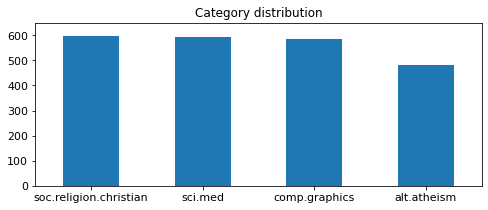

In [84]:
print(X.category_name.value_counts())

# plot barchart for X_sample
X.category_name.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, 650],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

soc.religion.christian    272
comp.graphics             268
sci.med                   253
alt.atheism               207
Name: category_name, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

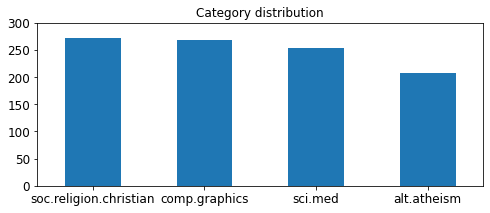

In [85]:
print(X_sample.category_name.value_counts())

# plot barchart for X_sample
X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, 300], 
                                           rot = 0, fontsize = 12, figsize = (8,3))

You can use following command to see other available styles to prettify your charts.
```python
print(plt.style.available)```

In [86]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


---

### >>> **Exercise 7 (5 min):**
Notice that for the `ylim` parameters we hardcoded the maximum value for y. Is it possible to automate this instead of hard-coding it? How would you go about doing that? (Hint: look at code above for clues)

In [87]:
upper_bound = max(X.category_name.value_counts()) + 10

soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: category_name, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

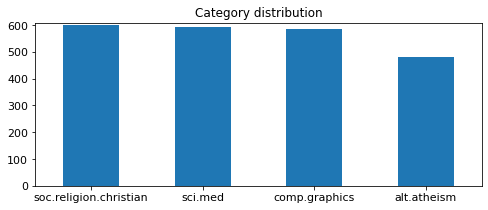

In [88]:
# Answer here

# plot barchart for X_sample
print(X.category_name.value_counts())

# plot barchart for X_sample
X.category_name.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, upper_bound],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

---

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

In [89]:
# Answer here
df_category_name_value_counts = pd.concat([X.category_name.value_counts(), 
                                          X_sample.category_name.value_counts()], 
                                          axis = 1, 
                                          ignore_index=True, 
                                          sort=False).rename(columns = {0:"X", 1:"X_sample"})
df_category_name_value_counts

,X,X_sample
soc.religion.christian,599,272
sci.med,594,253
comp.graphics,584,268
alt.atheism,480,207


<AxesSubplot:title={'center':'Category distribution'}>

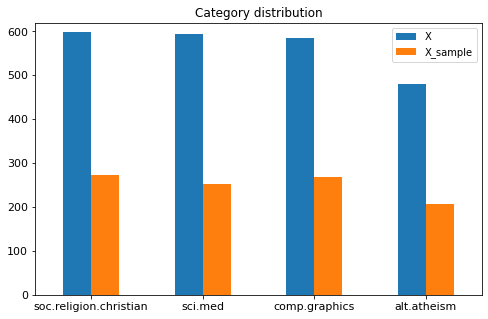

In [90]:
df_category_name_upper_bound = max(df_category_name_value_counts.X) + 20
df_category_name_value_counts.plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, df_category_name_upper_bound],        
                                    rot = 0, fontsize = 11, figsize = (8,5))

One thing that stood out from the both datasets, is that the distribution of the categories remain relatively the same, which is a good sign for us data scientist. There are many ways to conduct sampling on the dataset and still obtain a representative enough dataset. That is not the main focus in this notebook, but if you would like to know more about sampling and how the `sample` feature works, just reference the Pandas documentation and you will find interesting ways to conduct more advanced sampling.

---

### 5.2 Feature Creation
The other operation from the list above that we are going to practise on is the so-called feature creation. As the name suggests, in feature creation we are looking at creating new interesting and useful features from the original dataset; a feature which captures the most important information from the raw information we already have access to. In our `X` table, we would like to create some features from the `text` field, but we are still not sure what kind of features we want to create. We can think of an interesting problem we want to solve, or something we want to analyze from the data, or some questions we want to answer. This is one process to come up with features -- this process is usually called `feature engineering` in the data science community. 

We know what feature creation is so let us get real involved with our dataset and make it more interesting by adding some special features or attributes if you will. First, we are going to obtain the **unigrams** for each text. (Unigram is just a fancy word we use in Text Mining which stands for 'tokens' or 'individual words'.) Yes, we want to extract all the words found in each text and append it as a new feature to the pandas dataframe. The reason for extracting unigrams is not so clear yet, but we can start to think of obtaining some statistics about the articles we have: something like **word distribution** or **word frequency**.

Before going into any further coding, we will also introduce a useful text mining library called [NLTK](http://www.nltk.org/). The NLTK library is a natural language processing tool used for text mining tasks, so might as well we start to familiarize ourselves with it from now (It may come in handy for the final project!). In partcular, we are going to use the NLTK library to conduct tokenization because we are interested in splitting a sentence into its individual components, which we refer to as words, emojis, emails, etc. So let us go for it! We can call the `nltk` library as follows:

```python
import nltk
```

In [91]:
import nltk

# incase lack off stopwords list, please run this download.
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /Users/yeh/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [92]:
# takes a like a minute or two to process
X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x))


In [93]:
X[0:4]["unigrams"]

0    [From, :, sd345, @, city.ac.uk, (, Michael, Co...
1    [From, :, ani, @, ms.uky.edu, (, Aniruddha, B....
2    [From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...
3    [From, :, s0612596, @, let.rug.nl, (, M.M, ., ...
Name: unigrams, dtype: object

If you take a closer look at the `X` table now, you will see the new columns `unigrams` that we have added. You will notice that it contains an array of tokens, which were extracted from the original `text` field. At first glance, you will notice that the tokenizer is not doing a great job, let us take a closer at a single record and see what was the exact result of the tokenization using the `nltk` library.

In [94]:
X["unigrams"]

0       [From, :, sd345, @, city.ac.uk, (, Michael, Co...
1       [From, :, ani, @, ms.uky.edu, (, Aniruddha, B....
2       [From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...
3       [From, :, s0612596, @, let.rug.nl, (, M.M, ., ...
4       [From, :, stanly, @, grok11.columbiasc.ncr.com...
                              ...                        
2252    [From, :, roos, @, Operoni.Helsinki.FI, (, Chr...
2253    [From, :, mhollowa, @, ic.sunysb.edu, (, Micha...
2254    [From, :, sasghm, @, theseus.unx.sas.com, (, G...
2255    [From, :, Dan, Wallach, <, dwallach, @, cs.ber...
2256    [From, :, dyer, @, spdcc.com, (, Steve, Dyer, ...
Name: unigrams, Length: 2257, dtype: object

In [95]:
from nltk.corpus import stopwords

text_wo_stopwords = []
for item in X["unigrams"]:
     text_wo_stopwords.append(" ".join([term.lower() for term in item if term.lower() not in stopwords.words("english")]))


In [96]:
X["text_wo_stopwords"] = text_wo_stopwords

In [97]:
X[0:4]

,text,category,category_name,unigrams,text_wo_stopwords
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...",: sd345 @ city.ac.uk ( michael collier ) subje...
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....",: ani @ ms.uky.edu ( aniruddha b. deglurkar ) ...
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...",: djohnson @ cs.ucsd.edu ( darin johnson ) sub...
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...",: s0612596 @ let.rug.nl ( m.m . zwart ) subjec...


In [98]:
list(X[0:1]['unigrams'])

[['From',
  ':',
  'sd345',
  '@',
  'city.ac.uk',
  '(',
  'Michael',
  'Collier',
  ')',
  'Subject',
  ':',
  'Converting',
  'images',
  'to',
  'HP',
  'LaserJet',
  'III',
  '?',
  'Nntp-Posting-Host',
  ':',
  'hampton',
  'Organization',
  ':',
  'The',
  'City',
  'University',
  'Lines',
  ':',
  '14',
  'Does',
  'anyone',
  'know',
  'of',
  'a',
  'good',
  'way',
  '(',
  'standard',
  'PC',
  'application/PD',
  'utility',
  ')',
  'to',
  'convert',
  'tif/img/tga',
  'files',
  'into',
  'LaserJet',
  'III',
  'format',
  '.',
  'We',
  'would',
  'also',
  'like',
  'to',
  'do',
  'the',
  'same',
  ',',
  'converting',
  'to',
  'HPGL',
  '(',
  'HP',
  'plotter',
  ')',
  'files',
  '.',
  'Please',
  'email',
  'any',
  'response',
  '.',
  'Is',
  'this',
  'the',
  'correct',
  'group',
  '?',
  'Thanks',
  'in',
  'advance',
  '.',
  'Michael',
  '.',
  '--',
  'Michael',
  'Collier',
  '(',
  'Programmer',
  ')',
  'The',
  'Computer',
  'Unit',
  ',',
  'Emai

The `nltk` library does a pretty decent job of tokenizing our text. There are many other tokenizers online, such as [spaCy](https://spacy.io/), and the built in libraries provided by [scikit-learn](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html). We are making use of the NLTK library because it is open source and because it does a good job of segmentating text-based data. 

---

### 5.3 Feature subset selection
Okay, so we are making some headway here. Let us now make things a bit more interesting. We are going to do something different from what we have been doing thus far. We are going use a bit of everything that we have learned so far. Briefly speaking, we are going to move away from our main dataset (one form of feature subset selection), and we are going to generate a document-term matrix from the original dataset. In other words we are going to be creating something like this. 

![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vS01RrtPHS3r1Lf8UjX4POgDol-lVF4JAbjXM3SAOU-dOe-MqUdaEMWwJEPk9TtiUvcoSqTeE--lNep/pub?w=748&h=366)

Initially, it won't have the same shape as the table above, but we will get into that later. For now, let us use scikit learn built in functionalities to generate this document. You will see for yourself how easy it is to generate this table without much coding. 

In [99]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)

What we did with those two lines of code is that we transorfmed the articles into a **term-document matrix**. Those lines of code tokenize each article using a built-in, default tokenizer (often referred to as an `analzyer`) and then produces the word frequency vector for each document. We can create our own analyzers or even use the nltk analyzer that we previously built. To keep things tidy and minimal we are going to use the default analyzer provided by `CountVectorizer`. Let us look closely at this analyzer. 

In [100]:
analyze = count_vect.build_analyzer()
analyze("Hello World!")
#" ".join(list(X[4:5].text))

['hello', 'world']

---

### **>>> Exercise 9 (5 min):**
Let's analyze the first record of our X dataframe with the new analyzer we have just built. Go ahead try it!

In [101]:
X[0:1]

,text,category,category_name,unigrams,text_wo_stopwords
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...",: sd345 @ city.ac.uk ( michael collier ) subje...


In [102]:
# Answer here
analyze(X['text'][0])

['from',
 'sd345',
 'city',
 'ac',
 'uk',
 'michael',
 'collier',
 'subject',
 'converting',
 'images',
 'to',
 'hp',
 'laserjet',
 'iii',
 'nntp',
 'posting',
 'host',
 'hampton',
 'organization',
 'the',
 'city',
 'university',
 'lines',
 '14',
 'does',
 'anyone',
 'know',
 'of',
 'good',
 'way',
 'standard',
 'pc',
 'application',
 'pd',
 'utility',
 'to',
 'convert',
 'tif',
 'img',
 'tga',
 'files',
 'into',
 'laserjet',
 'iii',
 'format',
 'we',
 'would',
 'also',
 'like',
 'to',
 'do',
 'the',
 'same',
 'converting',
 'to',
 'hpgl',
 'hp',
 'plotter',
 'files',
 'please',
 'email',
 'any',
 'response',
 'is',
 'this',
 'the',
 'correct',
 'group',
 'thanks',
 'in',
 'advance',
 'michael',
 'michael',
 'collier',
 'programmer',
 'the',
 'computer',
 'unit',
 'email',
 'collier',
 'uk',
 'ac',
 'city',
 'the',
 'city',
 'university',
 'tel',
 '071',
 '477',
 '8000',
 'x3769',
 'london',
 'fax',
 '071',
 '477',
 '8565',
 'ec1v',
 '0hb']

---

Now let us look at the term-document matrix we built above.

In [103]:
# We can check the shape of this matrix by:
X_counts.shape

(2257, 35788)

In [104]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names()[0:10]

['00',
 '000',
 '0000',
 '0000001200',
 '000005102000',
 '0001',
 '000100255pixel',
 '00014',
 '000406',
 '0007']

![alt txt](https://i.imgur.com/57gA1sd.png)

Above we can see the features found in the all the documents `X`, which are basically all the terms found in all the documents. As I said earlier, the transformation is not in the pretty format (table) we saw above -- the term-document matrix. We can do many things with the `count_vect` vectorizer and its transformation `X_counts`. You can find more information on other cool stuff you can do with the [CountVectorizer](http://scikit-learn.org/stable/modules/feature_extraction.html#text-feature-extraction). 

Now let us try to obtain something that is as close to the pretty table I provided above. Before jumping into the code for doing just that, it is important to mention that the reason for choosing the `fit_transofrm` for the `CountVectorizer` is that it efficiently learns the vocabulary dictionary and returns a term-document matrix.

In the next bit of code, we want to extract the first five articles and transform them into document-term matrix, or in this case a 2-dimensional array. Here it goes. 

In [105]:
X[0:5]

,text,category,category_name,unigrams,text_wo_stopwords
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...",: sd345 @ city.ac.uk ( michael collier ) subje...
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....",: ani @ ms.uky.edu ( aniruddha b. deglurkar ) ...
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...",: djohnson @ cs.ucsd.edu ( darin johnson ) sub...
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...",: s0612596 @ let.rug.nl ( m.m . zwart ) subjec...
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...",: stanly @ grok11.columbiasc.ncr.com ( stanly ...


In [106]:
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

As you can see the result is just this huge sparse matrix, which is computationally intensive to generate and difficult to visualize. But we can see that the fifth record, specifically, contains a `1` in the beginning, which from our feature names we can deduce that this article contains exactly one `00` term.

---

### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [107]:
np.where(X_counts[4, 0:100].toarray() == 1)

(array([0, 0]), array([ 0, 37]))

In [108]:
# Answer here
idx_2nd_1 = np.where(X_counts[4, 0:100].toarray() == 1)[1][1]
print(f'the word of this 1 represents from the vocabulary is: \
{count_vect.get_feature_names()[idx_2nd_1]}')

the word of this 1 represents from the vocabulary is: 01


---

We can also use the vectorizer to generate word frequency vector for new documents or articles. Let us try that below:

In [109]:
count_vect.transform(['Something completely new.']).toarray()

array([[0, 0, 0, ..., 0, 0, 0]])

Now let us put a `00` in the document to see if it is detected as we expect. 

In [110]:
count_vect.transform(['00 Something completely new.']).toarray()

array([[1, 0, 0, ..., 0, 0, 0]])

Impressive, huh!

To get you started in thinking about how to better analyze your data or transformation, let us look at this nice little heat map of our term-document matrix. It may come as a surpise to see the gems you can mine when you start to look at the data from a different perspective. Visualization are good for this reason.

In [111]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names()[0:20]]

In [112]:
plot_x

['term_00',
 'term_000',
 'term_0000',
 'term_0000001200',
 'term_000005102000',
 'term_0001',
 'term_000100255pixel',
 'term_00014',
 'term_000406',
 'term_0007',
 'term_000usd',
 'term_0010',
 'term_001004',
 'term_0010580b',
 'term_001125',
 'term_001200201pixel',
 'term_0014',
 'term_001642',
 'term_00196',
 'term_002']

In [113]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]]

In [114]:
plot_z = X_counts[0:20, 0:20].toarray()

For the heat map, we are going to use another visualization library called `seaborn`. It's built on top of matplotlib and closely integrated with pandas data structures. One of the biggest advantages of seaborn is that its default aesthetics are much more visually appealing than matplotlib. See comparison below.

![alt txt](https://i.imgur.com/1isxmIV.png)

The other big advantage of seaborn is that seaborn has some built-in plots that matplotlib does not support. Most of these can eventually be replicated by hacking away at matplotlib, but they’re not built in and require much more effort to build.

So without further ado, let us try it now!

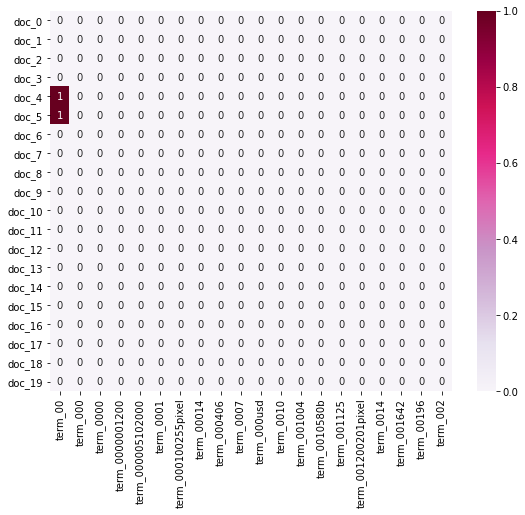

In [115]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

Check out more beautiful color palettes here: https://python-graph-gallery.com/197-available-color-palettes-with-matplotlib/

---

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

### **<<< Solution notes for Exercise 11:**

Since the term vectory is sparse, only retrive top N term will be reasonable. To avoid noise from rarely occuring words and reduce the size of the vectors, we remove any feature with a count below a threshold of $log10(Σ)$ where $Σ$ is the sum of all feature counts in the vector.

each doc term vectory only remain those TOP N terms, that make plot entile term-document matrix work out get a nice and useful visualization.

additional, I sample the entire doc. for more convenience plotting. 

In [116]:
# do array transpose for easy sum()
X_counts_transpose = X_counts.transpose()

In [117]:
# use the transposed array can save some time.
# need consume some time to finish, due to the high dimensional data and turn to dict by one step.
import math
from tqdm import tqdm

counts_term = {count_vect.get_feature_names()[idx]: sum(item.toarray()[0]) 
                 for idx, item in tqdm(enumerate(X_counts_transpose))}

35788it [08:56, 66.76it/s]


In [118]:
# select out those terms whose term frequency bigger than threshold

counts_threshold = int(math.log(sum(counts_term.values())))
counts_threshold_term = [term for term in counts_term if counts_term[term] > counts_threshold]
counts_threshold_term_idx = [count_vect.get_feature_names().index(term) for term in counts_threshold_term]

X_counts_counts_threshold_term = [[item[idx] for idx in counts_threshold_term_idx] 
                                  for item in X_counts.toarray()]

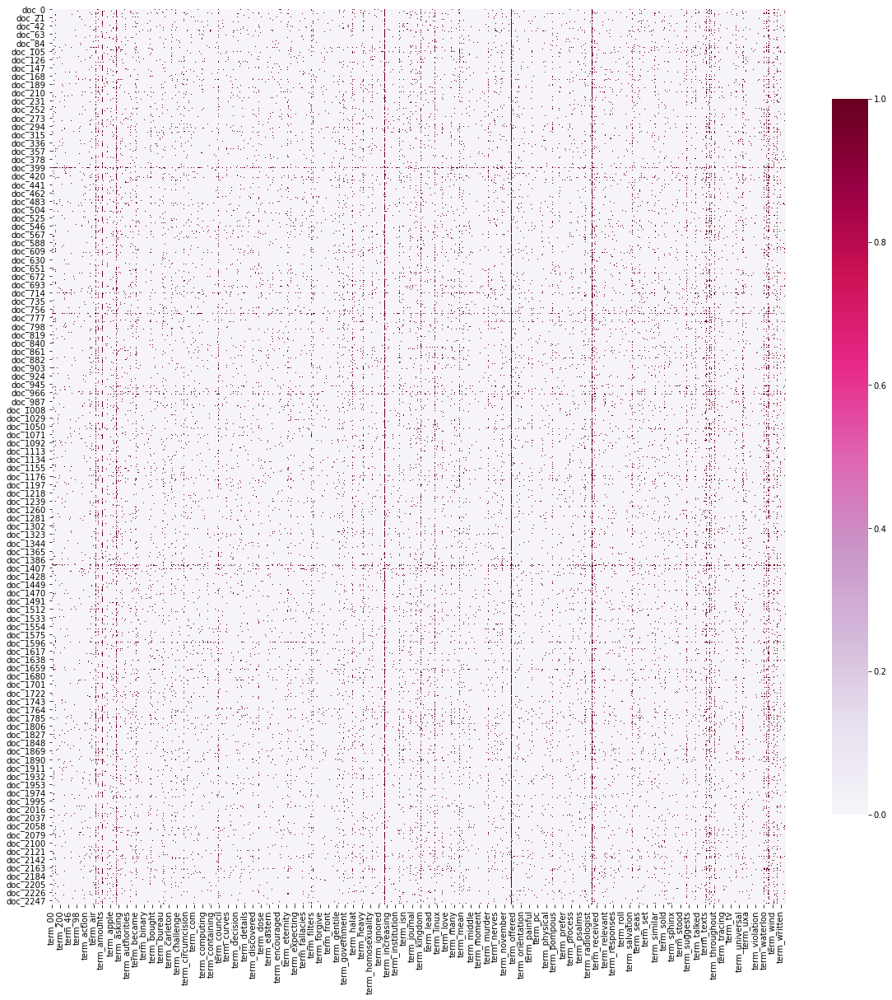

In [119]:
import seaborn as sns

df_todraw_ex = pd.DataFrame(np.array(X_counts_counts_threshold_term),
                            columns = [f'term_{str(i)}' for i in counts_threshold_term], 
                            index = [f'doc_{str(i)}' for i in list(X.index)[0:]])

plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw_ex,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False, cbar_kws={"shrink": .8})

### solution 2: sample the entire doc. for more convince plot.

In [120]:
df_todraw_ex["category_name"] = X.category_name.values

df_todraw_ex_sample = df_todraw_ex.sample(n = 100)

In [121]:
df_todraw_ex["category_name"].value_counts()

soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: category_name, dtype: int64

In [122]:
df_todraw_ex_sample["category_name"].value_counts()

sci.med                   28
comp.graphics             26
soc.religion.christian    24
alt.atheism               22
Name: category_name, dtype: int64

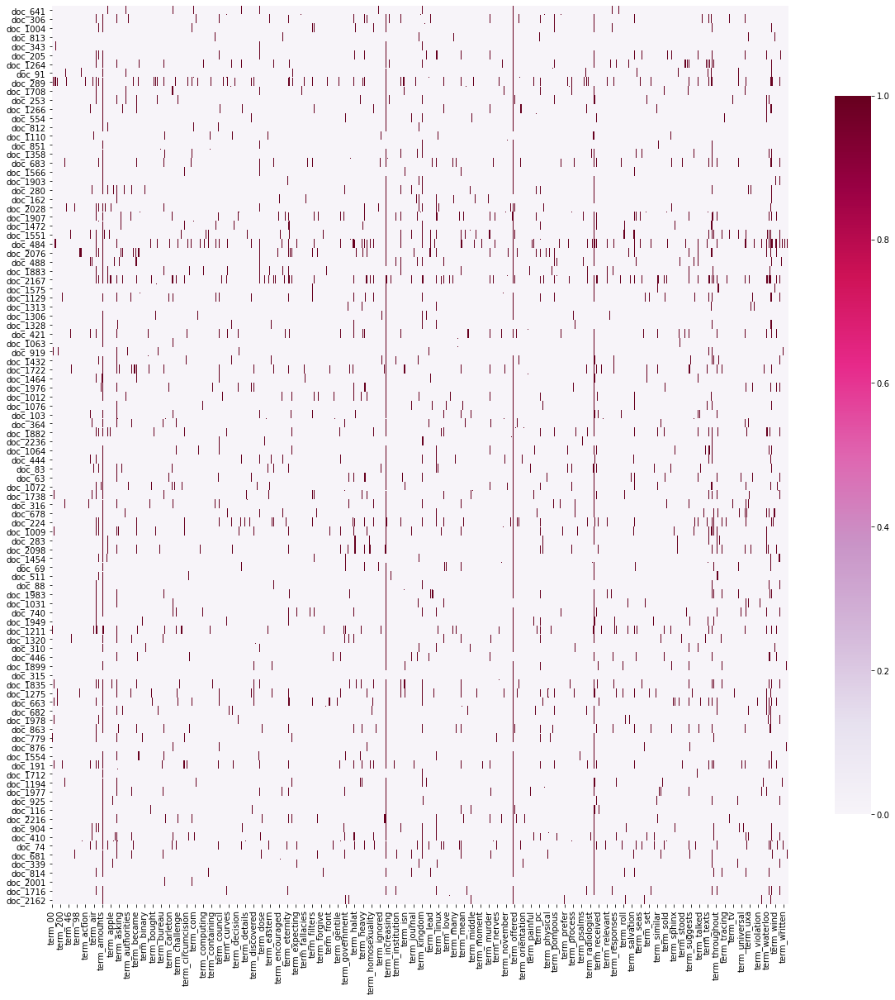

In [123]:
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw_ex_sample.drop(columns=["category_name"]),
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False, cbar_kws={"shrink": .8})

---

The great thing about what we have done so far is that we now open doors to new problems. Let us be optimistic. Even though we have the problem of sparsity and a very high dimensional data, we are now closer to uncovering wonders from the data. You see, the price you pay for the hard work is worth it because now you are gaining a lot of knowledge from what was just a list of what appeared to be irrelevant articles. Just the fact that you can blow up the data and find out interesting characteristics about the dataset in just a couple lines of code, is something that truly inspires me to practise Data Science. That's the motivation right there!

---

### 5.4 Dimensionality Reduction
Since we have just touched on the concept of sparsity most naturally the problem of "curse of dimentionality" comes up. I am not going to get into the full details of what dimensionality reduction is and what it is good for just the fact that is an excellent technique for visualizing data efficiently (please refer to notes for more information). All I can say is that we are going to deal with the issue of sparsity with a few lines of code. And we are going to try to visualize our data more efficiently with the results.

We are going to make use of Principal Component Analysis to efficeintly reduce the dimensions of our data, with the main goal of "finding a projection that captures the largest amount of variation in the data." This concept is important as it is very useful for visualizing and observing the characteristics of our dataset. 

[PCA Algorithm](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Input:** Raw term-vector matrix

**Output:** Projections 

In [124]:
from sklearn.decomposition import PCA

In [125]:
X_reduced = PCA(n_components = 2).fit_transform(X_counts.toarray())

In [126]:
X_reduced.shape

(2257, 2)

In [127]:
categories

['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

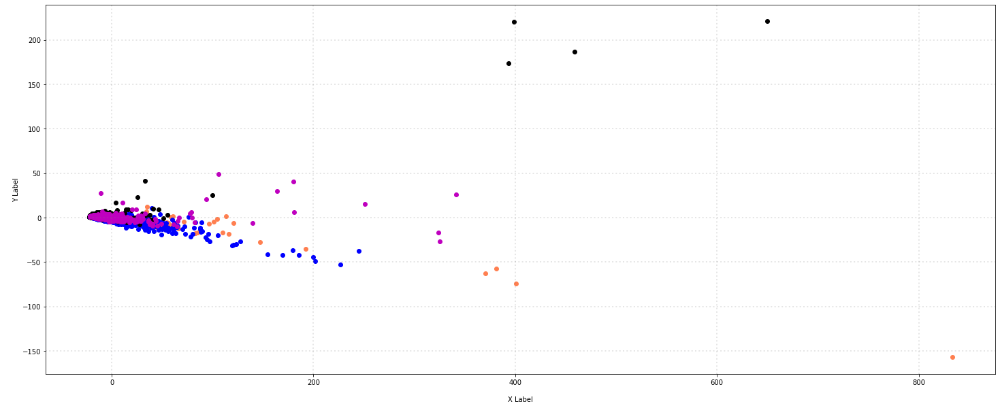

In [128]:
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(figsize = (25,10))
ax = fig.subplots()

for c, category in zip(col, categories):
    xs = X_reduced[X['category_name'] == category].T[0]
    ys = X_reduced[X['category_name'] == category].T[1]
   
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')

plt.show()

From the 2D visualization above, we can see a slight "hint of separation in the data"; i.e., they might have some special grouping by category, but it is not immediately clear. The PCA was applied to the raw frequencies and this is considered a very naive approach as some words are not really unique to a document. Only categorizing by word frequency is considered a "bag of words" approach. Later on in the course you will learn about different approaches on how to create better features from the term-vector matrix, such as term-frequency inverse document frequency so-called TF-IDF.

---

### >>> Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

### <<< Answer
by different angle, we can see major parts of different category that ever been masked.

although there are some outliers, but most elements of 4 category are nearby.

In [129]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D


In [130]:
X_reduced_ex = PCA(n_components = 3).fit_transform(X_counts.toarray())

In [131]:
X_reduced_ex.shape

(2257, 3)

In [132]:
categories

['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

In [133]:
X_reduced_ex

array([[-17.01172954,   0.45016638,  -1.31226068],
       [ -6.80574586,  -1.15880601,  -0.40488281],
       [ 15.79461065,   3.62233102,  12.70799078],
       ...,
       [ 19.97508176,  -2.85495805,   1.04076611],
       [163.88523745,  29.52467699,  -8.70178925],
       [-16.58569528,   0.61748551,  -1.88007234]])

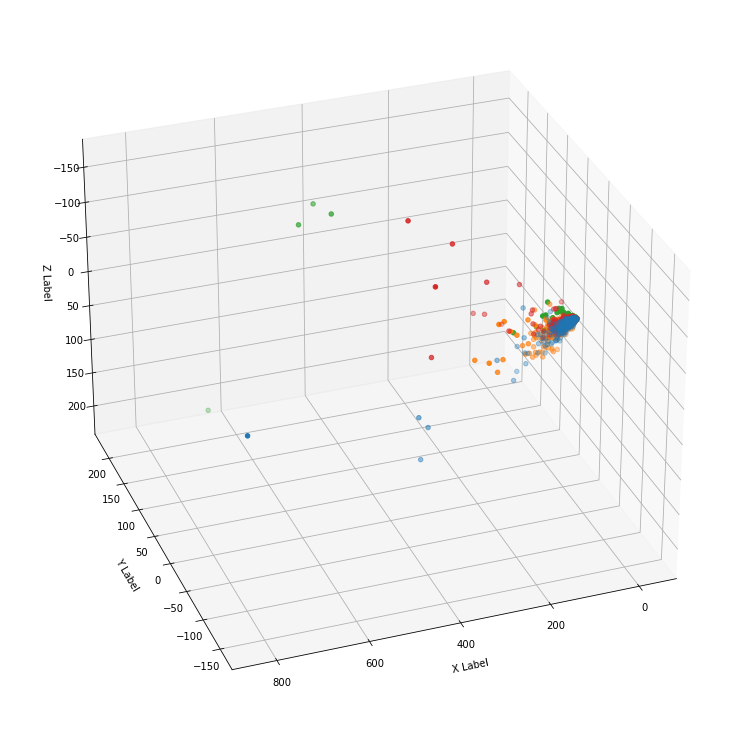

In [134]:
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-150, azim=110)

for c, category in zip(col, categories):
    xs = X_reduced_ex[X['category_name'] == category].T[0]
    ys = X_reduced_ex[X['category_name'] == category].T[1]
    zs = X_reduced_ex[X['category_name'] == category].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

plt.show()

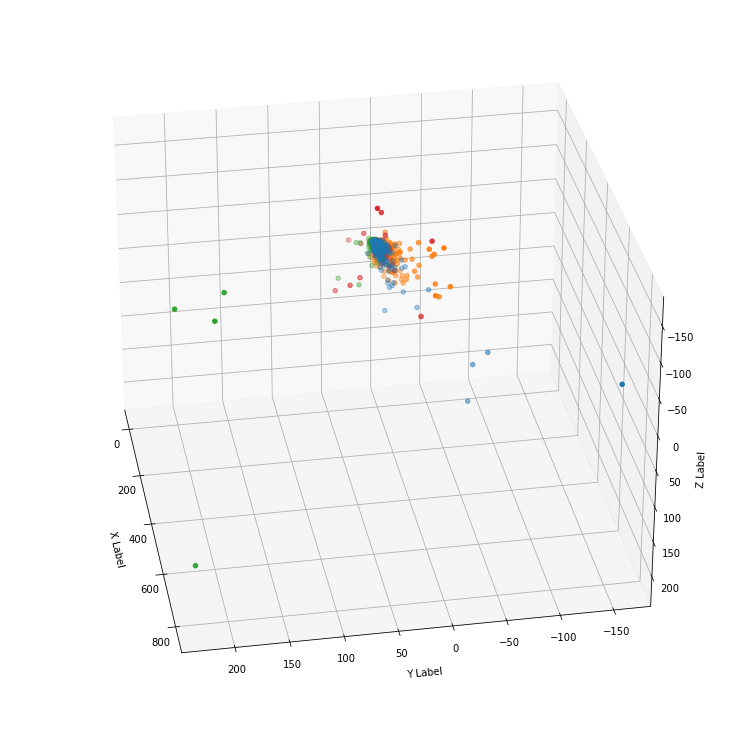

In [135]:
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-150, azim=190)

for c, category in zip(col, categories):
    xs = X_reduced_ex[X['category_name'] == category].T[0]
    ys = X_reduced_ex[X['category_name'] == category].T[1]
    zs = X_reduced_ex[X['category_name'] == category].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

plt.show()

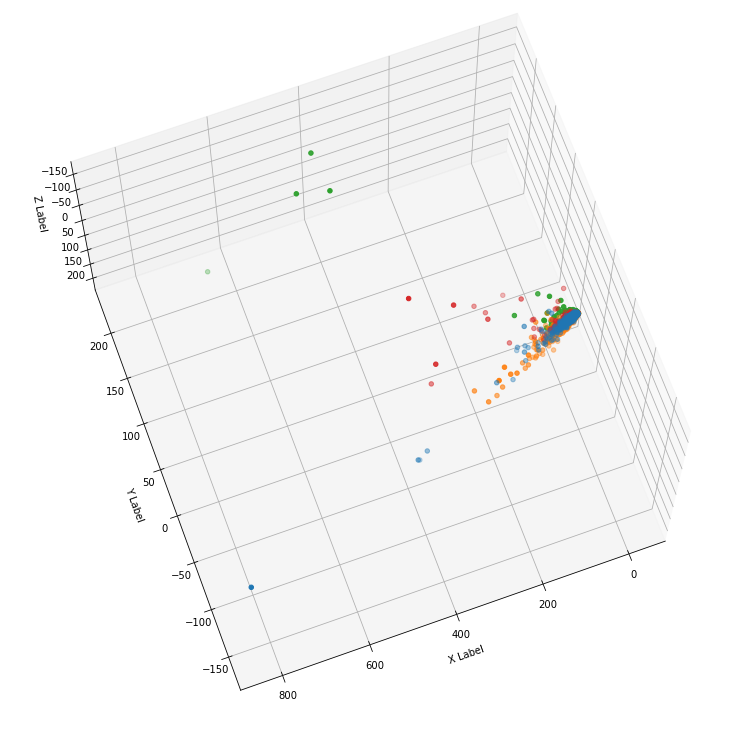

In [136]:
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-110, azim=110)

for c, category in zip(col, categories):
    xs = X_reduced_ex[X['category_name'] == category].T[0]
    ys = X_reduced_ex[X['category_name'] == category].T[1]
    zs = X_reduced_ex[X['category_name'] == category].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

plt.show()

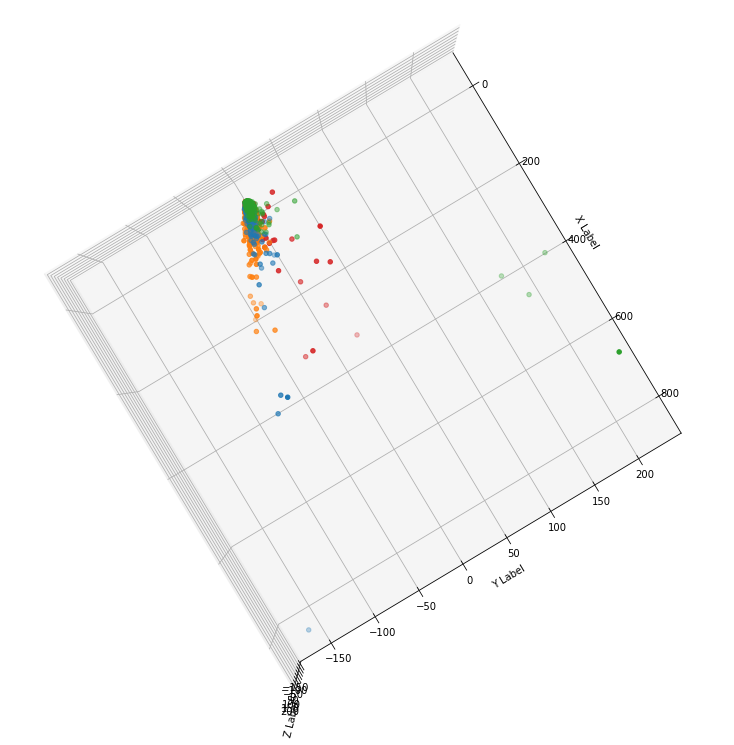

In [137]:
# Axis of rotation and save figures for review.
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-150, azim=110)

for c, category in zip(col, categories):
    xs = X_reduced_ex[X['category_name'] == category].T[0]
    ys = X_reduced_ex[X['category_name'] == category].T[1]
    zs = X_reduced_ex[X['category_name'] == category].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

for i in range(0,360,30):
    ax.view_init(elev=10., azim=i)
    plt.savefig(f"./img/pca/movie_{i:0=3}.png")

for i in range(0,360,30):
    ax.view_init(elev=-10., azim=i)
    plt.savefig(f"./img/pca/movie_elev-10_{i:0=3}.png")
    

for i in range(0,360,30):
    ax.view_init(elev=90., azim=i)
    plt.savefig(f"./img/pca/movie_elev+90_{i:0=3}.png")

---

### 5.5 Atrribute Transformation / Aggregation
We can do other things with the term-vector matrix besides applying dimensionalaity reduction technique to deal with sparsity problem. Here we are going to generate a simple distribution of the words found in all the entire set of articles. Intuitively, this may not make any sense, but in data science sometimes we take some things for granted, and we just have to explore the data first before making any premature conclusions. On the topic of attribute transformation, we will take the word distribution and put the distribution in a scale that makes it easy to analyze patterns in the distrubution of words. Let us get into it!

First, we need to compute these frequencies for each term in all documents. Visually speaking, we are seeking to add values of the 2D matrix, vertically; i.e., sum of each column. You can also refer to this process as aggregation, which we won't explore further in this notebook because of the type of data we are dealing with. But I believe you get the idea of what that includes.  

![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vTMfs0zWsbeAl-wrpvyCcZqeEUf7ggoGkDubrxX5XtwC5iysHFukD6c-dtyybuHnYigiRWRlRk2S7gp/pub?w=750&h=412)

In [138]:
# note this takes time to compute. You may want to reduce the amount of terms 
# you want to compute frequencies for
#term_frequencies = []
#for j in tqdm(range(0,X_counts.shape[1])):
#    term_frequencies.append(sum(X_counts[:,j].toarray()))

In [139]:
#term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

### I prefer to use transposed array that is more efficient.

In [140]:
# note this takes time to compute. You may want to reduce the amount of terms 
# you want to compute frequencies for
X_counts_transpose = X_counts.transpose()
term_frequencies = []
for item in X_counts_transpose:
    term_frequencies.append(sum(item.toarray()[0]))

In [141]:
count_vect.get_feature_names()[:10]

['00',
 '000',
 '0000',
 '0000001200',
 '000005102000',
 '0001',
 '000100255pixel',
 '00014',
 '000406',
 '0007']

In [142]:
term_frequencies[:10]

[134, 92, 1, 2, 1, 3, 1, 1, 1, 1]

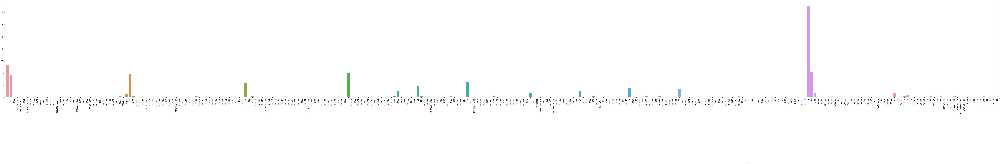

In [143]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names()[:300], rotation = 90);

---

### >>> **Exercise 13 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

### **notes: plotly installation troubles shooting**
[Jupyter Lab problems](https://plotly.com/python/troubleshooting/)

**plotly offline model not displaying plots**

NEED to install plotly-extension with jupyter labextension list
install it if missing with: ```jupyter labextension install @jupyterlab/plotly-extension```

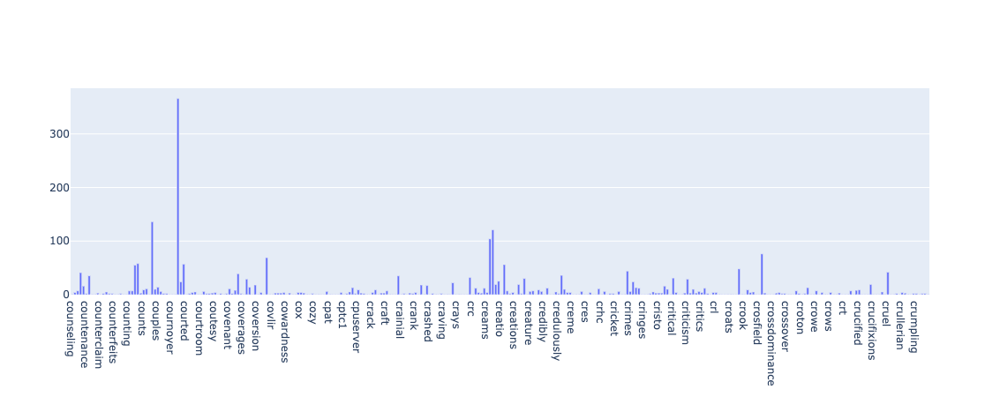

In [144]:
# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go

# Set notebook mode to work in offline
pyo.init_notebook_mode()

# Create traces
trace_bar = go.Bar(
    x=count_vect.get_feature_names()[10000:10300],
    y=term_frequencies[10000:10300]
)

trace_scatter = go.Scatter(
    x=count_vect.get_feature_names()[10000:10030],
    y=term_frequencies[10000:10030],
    mode='markers'
)

# Fill out data with our traces
data = [trace_bar]
# Plot it and save as basic-line.html
pyo.iplot(data, filename = 'plotly-bar-chart')

---

### >>> **Exercise 14 (take home):** 
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


### <<< notes of solution

like what ever done previous >>> Since the term vectory is sparse, only retrive top N term will be reasonable. To avoid noise from rarely occuring words and reduce the size of the vectors, we remove any feature with a count below a threshold of  log10(Σ)  where  Σ  is the sum of all feature counts in the vector.

each doc term vectory only remain those TOP N terms, that make plot entile term-document matrix work out get a nice and useful visualization. 

In [145]:
# need consume some time to finish, due to the high dimensional data

import math
from collections import Counter

counts_threshold = int(math.log(sum(term_frequencies)))
counts_threshold_term_frequencies = {term:term_frequencies[idx] 
                          for idx, term in enumerate(count_vect.get_feature_names()) 
                                     if term_frequencies[idx] > counts_threshold}

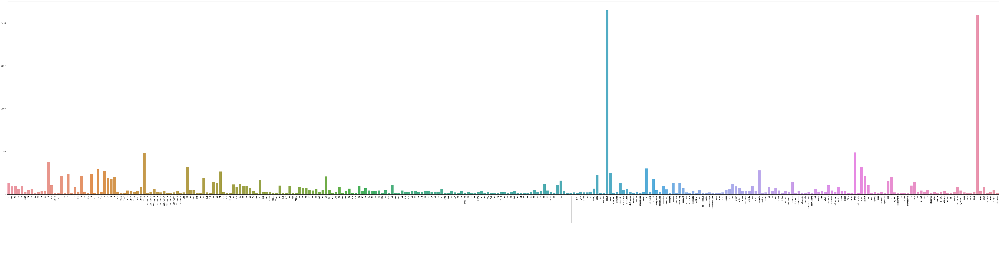

In [146]:
plt.subplots(figsize=(100, 20))
g = sns.barplot(x=list(counts_threshold_term_frequencies.keys())[:300],
                y=list(counts_threshold_term_frequencies.values())[:300])
g.set_xticklabels(list(counts_threshold_term_frequencies.keys())[:300], rotation = 90);

---

### >>> **Exercise 15 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

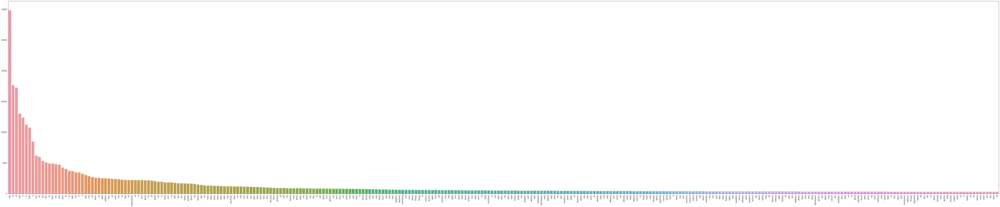

In [147]:
# Answer here
counts_threshold_term_frequencies_sorted = {k: v 
                                            for k, v in sorted(counts_threshold_term_frequencies.items(), 
                                                               key=lambda item: item[1], 
                                                               reverse=True)}
plt.subplots(figsize=(100, 20))
g = sns.barplot(x=list(counts_threshold_term_frequencies_sorted.keys())[:300],
                y=list(counts_threshold_term_frequencies_sorted.values())[:300])
g.set_xticklabels(list(counts_threshold_term_frequencies_sorted.keys())[:300], rotation = 90);

---

Since we already have those term frequencies, we can also transform the values in that vector into the log distribution. All we need is to import the `math` library provided by python and apply it to the array of values of the term frequency vector. This is a typical example of attribute transformation. Let's go for it. The log distribution is a technique to visualize the term frequency into a scale that makes you easily visualize the distribution in a more readable format. In other words, the variations between the term frequencies are now easy to observe. Let us try it out!

In [148]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

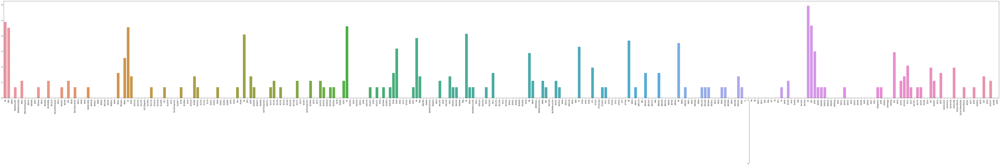

In [149]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names()[:300], rotation = 90);

Besides observing a complete transformation on the disrtibution, notice the scale on the y-axis. The log distribution in our unsorted example has no meaning, but try to properly sort the terms by their frequency, and you will see an interesting effect. Go for it!

---

### 5.6 Discretization and Binarization
In this section we are going to discuss a very important pre-preprocessing technique used to transform the data, specifically categorical values, into a format that satisfies certain criteria required by particular algorithms. Given our current original dataset, we would like to transform one of the attributes, `category_name`, into four binary attributes. In other words, we are taking the category name and replacing it with a `n` asymmetric binary attributes. The logic behind this transformation is discussed in detail in the recommended Data Mining text book (please refer to it on page 58). People from the machine learning community also refer to this transformation as one-hot encoding, but as you may become aware later in the course, these concepts are all the same, we just have different prefrence on how we refer to the concepts. Let us take a look at what we want to achieve in code. 

In [150]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [151]:
mlb = preprocessing.LabelBinarizer()

In [152]:
mlb.fit(X.category)

LabelBinarizer()

In [153]:
mlb.classes_

array([0, 1, 2, 3])

In [154]:
X['bin_category'] = mlb.transform(X['category']).tolist()

In [155]:
X[0:9]

,text,category,category_name,unigrams,text_wo_stopwords,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...",: sd345 @ city.ac.uk ( michael collier ) subje...,"[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....",: ani @ ms.uky.edu ( aniruddha b. deglurkar ) ...,"[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...",: djohnson @ cs.ucsd.edu ( darin johnson ) sub...,"[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...",: s0612596 @ let.rug.nl ( m.m . zwart ) subjec...,"[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...",: stanly @ grok11.columbiasc.ncr.com ( stanly ...,"[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...",: vbv @ lor.eeap.cwru.edu ( virgilio ( dean ) ...,"[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...",: jodfishe @ silver.ucs.indiana.edu ( joseph d...,"[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...",: aldridge @ netcom.com ( jacquelin aldridge )...,"[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...",: geb @ cs.pitt.edu ( gordon banks ) subject :...,"[0, 0, 1, 0]"


Take a look at the new attribute we have added to the `X` table. You can see that the new attribute, which is called `bin_category`, contains an array of 0's and 1's. The `1` is basically to indicate the position of the label or category we binarized. If you look at the first two records, the one is places in slot 2 in the array; this helps to indicate to any of the algorithms which we are feeding this data to, that the record belong to that specific category. 

Attributes with **continuous values** also have strategies to tranform the data; this is usually called **Discretization** (please refer to the text book for more inforamation).

---

### >>> **Exercise 16 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

### <<< **answer: yes**
Generate the binarization using the `category_name` column instead that can work for one hot enconding. because our category and category_name are One-to-one correspondence, and ```binarization``` can accept multilabels by str type. refer to [sklearn.preprocessing.LabelBinarizer](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelBinarizer.html)

In [156]:
mlb_ex = preprocessing.LabelBinarizer()

In [157]:
mlb_ex.fit(X.category_name)

LabelBinarizer()

In [158]:
mlb_ex.classes_

array(['alt.atheism', 'comp.graphics', 'sci.med',
       'soc.religion.christian'], dtype='<U22')

In [159]:
X['bin_category_ex'] = mlb_ex.transform(X['category_name']).tolist()

In [160]:
X.bin_category == X.bin_category_ex

0       True
1       True
2       True
3       True
4       True
        ... 
2252    True
2253    True
2254    True
2255    True
2256    True
Length: 2257, dtype: bool

In [161]:
X[0:9]

,text,category,category_name,unigrams,text_wo_stopwords,bin_category,bin_category_ex
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...",: sd345 @ city.ac.uk ( michael collier ) subje...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....",: ani @ ms.uky.edu ( aniruddha b. deglurkar ) ...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...",: djohnson @ cs.ucsd.edu ( darin johnson ) sub...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...",: s0612596 @ let.rug.nl ( m.m . zwart ) subjec...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...",: stanly @ grok11.columbiasc.ncr.com ( stanly ...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...",: vbv @ lor.eeap.cwru.edu ( virgilio ( dean ) ...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...",: jodfishe @ silver.ucs.indiana.edu ( joseph d...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...",: aldridge @ netcom.com ( jacquelin aldridge )...,"[0, 0, 1, 0]","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...",: geb @ cs.pitt.edu ( gordon banks ) subject :...,"[0, 0, 1, 0]","[0, 0, 1, 0]"


---

# 6. Data Exploration

Sometimes you need to take a peek at your data to understand the relationships in your dataset. Here, we will focus in a similarity example. Let's take 3 documents and compare them.

In [162]:
# We retrieve 2 sentences for a random record, here, indexed at 50 and 100
document_to_transform_1 = []
random_record_1 = X.iloc[50]
random_record_1 = random_record_1['text']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = X.iloc[100]
random_record_2 = random_record_2['text']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = X.iloc[150]
random_record_3 = random_record_3['text']
document_to_transform_3.append(random_record_3)

Let's look at our emails.

In [163]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['From: ab@nova.cc.purdue.edu (Allen B) Subject: Re: TIFF: philosophical significance of 42 Organization: Purdue University Lines: 39  In article <prestonm.735400848@cs.man.ac.uk> prestonm@cs.man.ac.uk (Martin   Preston) writes: > Why not use the PD C library for reading/writing TIFF files? It took me a > good 20 minutes to start using them in your own app.  I certainly do use it whenever I have to do TIFF, and it usually works very well.  That\'s not my point.  I\'m >philosophically< opposed to it because of its complexity.  This complexity has led to some programs\' poor TIFF writers making some very bizarre files, other programs\' inability to load TIFF images (though they\'ll save them, of course), and a general inability to interchange images between different environments despite the fact they all think they understand TIFF.  As the saying goes, "It\'s not me I\'m worried about- it\'s all the >other<  assholes out there!"  I\'ve had big trouble with misuse and abuse of TIFF over 

In [164]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vecors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [165]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})

Cosine Similarity using count bw 1 and 2: 0.608862
Cosine Similarity using count bw 1 and 3: 0.622050
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000


As expected, cosine similarity between a sentence and itself is 1. Between 2 entirely different sentences, it will be 0. 

We can assume that we have the more common features in bthe documents 1 and 3 than in documents 1 and 2. This reflects indeed in a higher similarity than that of sentences 1 and 3. 


---

## 7. Concluding Remarks

Wow! We have come a long way! We can now call ourselves experts of Data Preprocessing. You should feel excited and proud because the process of Data Mining usually involves 70% preprocessing and 30% training learning models. You will learn this as you progress in the Data Mining course. I really feel that if you go through the exercises and challenge yourself, you are on your way to becoming a super Data Scientist. 

From here the possibilities for you are endless. You now know how to use almost every common technique for preprocessing with state-of-the-art tools, such as as Pandas and Scikit-learn. You are now with the trend! 

After completing this notebook you can do a lot with the results we have generated. You can train algorithms and models that are able to classify articles into certain categories and much more. You can also try to experiment with different datasets, or venture further into text analytics by using new deep learning techniques such as word2vec. All of this will be presented in the next lab session. Until then, go teach machines how to be intelligent to make the world a better place. 

----

## . References

- Pandas cook book ([Recommended for starters](http://pandas.pydata.org/pandas-docs/stable/cookbook.html))
- [Pang-Ning Tan, Michael Steinbach, Vipin Kumar, Introduction to Data Mining, Addison Wesley](https://dl.acm.org/citation.cfm?id=1095618)

# Part 2: New Dataset

## 1. The Data: WASSA-2017 Shared Task on Emotion Intensity (EmoInt)

**Dataset:**
[SemEval 2017 Task](https://competitions.codalab.org/competitions/16380)

This [dataset](https://competitions.codalab.org/competitions/16380#learn_the_details-datasets) Part of the 8th Workshop on Computational Approaches to Subjectivity, Sentiment and Social Media Analysis (WASSA-2017), which is to be held in conjunction with EMNLP-2017.

**Details:**
Training and test datasets are provided for four emotions: joy, sadness, fear, and anger. For example, the anger training dataset has tweets along with a real-valued score between 0 and 1 indicating the degree of anger felt by the speaker. The test data includes only the tweet text. Gold emotion intensity scores will be released after the evaluation period. Further details of this data are available in this paper:

Training set:

for anger (updated Mar 8, 2017)
for fear (released Feb 17, 2017)
for joy (released Feb 15, 2017)
for sadness (released Feb 17, 2017)

Development set:

Without intensity labels:

for anger (released Feb 24, 2017)
for fear (released Feb 24, 2017)
for joy (released Feb 24, 2017)
for sadness (released Feb 24, 2017)

**Task:** Classify text data into 4 different emotions using word embedding and other deep information retrieval approaches.

![pic0](pics/pic0.png)

---

## 2. Data Preparation
We start by loading the txt files into pandas dataframe for training and testing.

In [166]:
import pandas as pd

### training data
anger_train = pd.read_csv("data/semeval/train/anger-ratings-0to1.train.txt",
                         sep="\t", header=None,names=["id", "text", "emotion", "intensity"])
sadness_train = pd.read_csv("data/semeval/train/sadness-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_train = pd.read_csv("data/semeval/train/fear-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_train = pd.read_csv("data/semeval/train/joy-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

In [167]:
# combine 4 sub-dataset
train_df = pd.concat([anger_train, fear_train, joy_train, sadness_train], ignore_index=True)

In [168]:
### testing data
anger_test = pd.read_csv("data/semeval/dev/anger-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
sadness_test = pd.read_csv("data/semeval/dev/sadness-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_test = pd.read_csv("data/semeval/dev/fear-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_test = pd.read_csv("data/semeval/dev/joy-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

# combine 4 sub-dataset
test_df = pd.concat([anger_test, fear_test, joy_test, sadness_test], ignore_index=True)
train_df.head()

,id,text,emotion,intensity
0,10000,How the fu*k! Who the heck! moved my fridge!.....,anger,0.938
1,10001,So my Indian Uber driver just called someone t...,anger,0.896
2,10002,@DPD_UK I asked for my parcel to be delivered ...,anger,0.896
3,10003,so ef whichever butt wipe pulled the fire alar...,anger,0.896
4,10004,Don't join @BTCare they put the phone down on ...,anger,0.896


In [169]:
# shuffle dataset
train_df = train_df.sample(frac=1)
test_df = test_df.sample(frac=1)

In [170]:
print("Shape of Training df: ", train_df.shape)
print("Shape of Testing df: ", test_df.shape)

Shape of Training df:  (3613, 4)
Shape of Testing df:  (347, 4)


## 3. Data Transformation
So we want to explore and understand our data a little bit better. Before we do that we definitely need to apply some transformations just so we can have our dataset in a nice format to be able to explore it freely and more efficient. Lucky for us, there are powerful scientific tools to transform our data into that tabular format we are so farmiliar with. So that is what we will do in the next section--transform our data into a nice table format.

---

### 3.1 Converting list into Pandas Dataframe
Here we will show you how to convert list objects into a pandas dataframe. And by the way, a pandas dataframe is nothing more than a table magically stored for efficient information retrieval.

Let's take at look some of the records that are contained in our subset of the data

In [171]:
train_df.head(3)

,id,text,emotion,intensity
3375,40548,Contactless affliction kart are the needs must...,sadness,0.375
937,20080,@camilluddington the fact that YOURE nervous m...,fear,0.812
1303,20446,New play through tonight! Pretty much a blind ...,fear,0.542


Here is one way to take an overview of the whole dataframe. 

In [172]:
train_df.describe(include="all")

,id,text,emotion,intensity
count,3613.000000,3613,3613,3613.000000
unique,NaN,3565,4,NaN
top,NaN,@ArcadianLuthier -- taking out his feelings on...,fear,NaN
freq,NaN,2,1147,NaN
mean,24719.287296,NaN,NaN,0.495199
std,10715.806835,NaN,NaN,0.190368
min,10000.000000,NaN,NaN,0.019000
25%,20046.000000,NaN,NaN,0.354000
50%,20949.000000,NaN,NaN,0.479000
75%,30705.000000,NaN,NaN,0.625000


In [173]:
train_df.head()

,id,text,emotion,intensity
3375,40548,Contactless affliction kart are the needs must...,sadness,0.375
937,20080,@camilluddington the fact that YOURE nervous m...,fear,0.812
1303,20446,New play through tonight! Pretty much a blind ...,fear,0.542
1573,20716,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417
1170,20313,"In addition to fiction, wish me luck on my res...",fear,0.620


In [174]:
for t in train_df["text"][:3]:
    print(t)

Contactless affliction kart are the needs must regarding the psychological moment!: xbeUJGB
@camilluddington the fact that YOURE nervous makes me want to crawl in a hole
New play through tonight! Pretty much a blind run. Only played the game once and maybe got 2 levels it. #Rage #horror


### Adding Columns: **Add label column for mapping emotion by digi**

One of the great advantages of a pandas dataframe is its flexibility. We can add columns to the current dataset programmatically with very little effort.

Nice! Isn't it? With this format we can conduct many operations easily and efficiently since Pandas dataframes provide us with a wide range of built-in features/functionalities. These features are operations which can directly and quickly be applied to the dataset. These operations may include standard operations like **removing records with missing values** and **aggregating new fields** to the current table (hereinafter referred to as a dataframe), which is desirable in almost every data mining project. Go Pandas!

In [175]:
# dict for mapping emotion to digi label
dict_emotion = {'anger':0, 'fear':1, 'joy':2, 'sadness':3}
dict_emotion_reverse = {0:'anger', 1:'fear', 2:'joy', 3:'sadness'}

train_df["label"] = train_df["emotion"].map(lambda x:dict_emotion[x])
test_df["label"] = test_df["emotion"].map(lambda x:dict_emotion[x])

---

### 3.2 Familiarizing yourself with the Data:
**we will go through all by following lab template.**

To begin to show you the awesomeness of Pandas dataframes, let us look at how to run a simple query on our dataset. We want to query for the first 10 rows (documents), and we only want to keep the `text` and `emotion` attributes or fields.

In [176]:
# a simple query
train_df[0:10][["text", "emotion"]]

,text,emotion
3375,Contactless affliction kart are the needs must...,sadness
937,@camilluddington the fact that YOURE nervous m...,fear
1303,New play through tonight! Pretty much a blind ...,fear
1573,@EurekaForbes U got to b kidding me. Anu from ...,fear
1170,"In addition to fiction, wish me luck on my res...",fear
408,@JuliaHB1 Bloody right #fume,anger
1820,Oh I get i see it's #TexasTech playing tonight...,fear
1243,My roommate turns the sink off with her foot t...,fear
1309,When someone tells you they're going to 'tear ...,fear
670,@stoozyboy1 @chris_sutton73 😂😂 Oh the zombie r...,anger


Let us look at a few more interesting queries to familiarize ourselves with the efficiency and conveniency of Pandas dataframes.

#### Let's query the last 10 records

Ready for some sourcery? Brace yourselves! Let us see if we can query every 10th record in our dataframe. In addition, our query must only contain the first 10 records. For this we will use the build-in function called `iloc`. This allows us to query a selection of our dataset by position. 

In [177]:
# using iloc (by position)
train_df.iloc[::10, 0:2][0:10]

,id,text
3375,40548,Contactless affliction kart are the needs must...
3301,40474,some people leave toilets in fucking grim states
2346,30342,"She gave a playful wink, taking the goggles of..."
1787,20930,@Rocks_n_Ropes Can't believe how rude your cas...
2607,30603,Follow me in instagram 1.0.7 #love #TagsForLik...
2532,30528,Turkish exhilaration: for a 30% shade off irru...
982,20125,The focal points of war lie in #terrorism and ...
3491,40664,@markoheight @Cassie_OB we sound like vampires...
1681,20824,@DeionSandersJr @DeionSanders so bad...Slash p...
1934,21077,Enjoyed seamlessly setting my #alarm using #ok...


You can also use the `loc` function to explicity define the columns you want to query. Take a look at this [great discussion](https://stackoverflow.com/questions/28757389/pandas-loc-vs-iloc-vs-ix-vs-at-vs-iat/43968774) on the differences between the `iloc` and `loc` functions.

In [178]:
# using loc (by label)
train_df.loc[::10, 'text'][0:10]

3375    Contactless affliction kart are the needs must...
3301     some people leave toilets in fucking grim states
2346    She gave a playful wink, taking the goggles of...
1787    @Rocks_n_Ropes Can't believe how rude your cas...
2607    Follow me in instagram 1.0.7 #love #TagsForLik...
2532    Turkish exhilaration: for a 30% shade off irru...
982     The focal points of war lie in #terrorism and ...
3491    @markoheight @Cassie_OB we sound like vampires...
1681    @DeionSandersJr @DeionSanders so bad...Slash p...
1934    Enjoyed seamlessly setting my #alarm using #ok...
Name: text, dtype: object

In [179]:
# standard query (Cannot simultaneously select rows and columns)
train_df[::10][0:10]

,id,text,emotion,intensity,label
3375,40548,Contactless affliction kart are the needs must...,sadness,0.375,3
3301,40474,some people leave toilets in fucking grim states,sadness,0.420,3
2346,30342,"She gave a playful wink, taking the goggles of...",joy,0.534,2
1787,20930,@Rocks_n_Ropes Can't believe how rude your cas...,fear,0.312,1
2607,30603,Follow me in instagram 1.0.7 #love #TagsForLik...,joy,0.354,2
2532,30528,Turkish exhilaration: for a 30% shade off irru...,joy,0.404,2
982,20125,The focal points of war lie in #terrorism and ...,fear,0.750,1
3491,40664,@markoheight @Cassie_OB we sound like vampires...,sadness,0.292,3
1681,20824,@DeionSandersJr @DeionSanders so bad...Slash p...,fear,0.375,1
1934,21077,Enjoyed seamlessly setting my #alarm using #ok...,fear,0.208,1


#### Attribute access

### ** >>> Exercise 2 (take home): let's apply those techniques to new data** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [180]:
train_df.text[::10][:10]

3375    Contactless affliction kart are the needs must...
3301     some people leave toilets in fucking grim states
2346    She gave a playful wink, taking the goggles of...
1787    @Rocks_n_Ropes Can't believe how rude your cas...
2607    Follow me in instagram 1.0.7 #love #TagsForLik...
2532    Turkish exhilaration: for a 30% shade off irru...
982     The focal points of war lie in #terrorism and ...
3491    @markoheight @Cassie_OB we sound like vampires...
1681    @DeionSandersJr @DeionSanders so bad...Slash p...
1934    Enjoyed seamlessly setting my #alarm using #ok...
Name: text, dtype: object

#### selection by *position*

In [181]:
# using iloc (by position). We can select columns want, then make selection.
train_df.iloc[:, :2][::10][:10]

,id,text
3375,40548,Contactless affliction kart are the needs must...
3301,40474,some people leave toilets in fucking grim states
2346,30342,"She gave a playful wink, taking the goggles of..."
1787,20930,@Rocks_n_Ropes Can't believe how rude your cas...
2607,30603,Follow me in instagram 1.0.7 #love #TagsForLik...
2532,30528,Turkish exhilaration: for a 30% shade off irru...
982,20125,The focal points of war lie in #terrorism and ...
3491,40664,@markoheight @Cassie_OB we sound like vampires...
1681,20824,@DeionSandersJr @DeionSanders so bad...Slash p...
1934,21077,Enjoyed seamlessly setting my #alarm using #ok...


#### selection by *label*

In [182]:
# using loc (by label), We can select whole column, then make selection.
train_df.loc[:, 'text'][::10][:10]

3375    Contactless affliction kart are the needs must...
3301     some people leave toilets in fucking grim states
2346    She gave a playful wink, taking the goggles of...
1787    @Rocks_n_Ropes Can't believe how rude your cas...
2607    Follow me in instagram 1.0.7 #love #TagsForLik...
2532    Turkish exhilaration: for a 30% shade off irru...
982     The focal points of war lie in #terrorism and ...
3491    @markoheight @Cassie_OB we sound like vampires...
1681    @DeionSandersJr @DeionSanders so bad...Slash p...
1934    Enjoyed seamlessly setting my #alarm using #ok...
Name: text, dtype: object

#### selection by *index*

In [183]:
train_df["text"][::10][:10]

3375    Contactless affliction kart are the needs must...
3301     some people leave toilets in fucking grim states
2346    She gave a playful wink, taking the goggles of...
1787    @Rocks_n_Ropes Can't believe how rude your cas...
2607    Follow me in instagram 1.0.7 #love #TagsForLik...
2532    Turkish exhilaration: for a 30% shade off irru...
982     The focal points of war lie in #terrorism and ...
3491    @markoheight @Cassie_OB we sound like vampires...
1681    @DeionSandersJr @DeionSanders so bad...Slash p...
1934    Enjoyed seamlessly setting my #alarm using #ok...
Name: text, dtype: object

In [184]:
train_df[::10][:10]["text"]

3375    Contactless affliction kart are the needs must...
3301     some people leave toilets in fucking grim states
2346    She gave a playful wink, taking the goggles of...
1787    @Rocks_n_Ropes Can't believe how rude your cas...
2607    Follow me in instagram 1.0.7 #love #TagsForLik...
2532    Turkish exhilaration: for a 30% shade off irru...
982     The focal points of war lie in #terrorism and ...
3491    @markoheight @Cassie_OB we sound like vampires...
1681    @DeionSandersJr @DeionSanders so bad...Slash p...
1934    Enjoyed seamlessly setting my #alarm using #ok...
Name: text, dtype: object

#### Selection by callable

In [185]:
train_df[lambda df: df["text"].index%10 == 0][:10]

,id,text,emotion,intensity,label
1170,20313,"In addition to fiction, wish me luck on my res...",fear,0.620,1
1820,20963,Oh I get i see it's #TexasTech playing tonight...,fear,0.292,1
670,10670,@stoozyboy1 @chris_sutton73 😂😂 Oh the zombie r...,anger,0.375,0
1440,20583,@ChrisChristie You have no Police credentials-...,fear,0.479,1
3260,40433,@coalese 😂😂😂. Sure half these stars get togeth...,sadness,0.458,3
650,10650,doing some testing with my current earth burst...,anger,0.375,0
1470,20613,@kevinrouth Now that's what I call a gameface!...,fear,0.458,1
3250,40423,History repeating itself..GAA is our culture h...,sadness,0.458,3
3050,40223,@CCTakato at least in crystal every part of it...,sadness,0.613,3
780,10780,@leener00 @libbyfloyd1 @G_Eazy my snap is andr...,anger,0.271,0


#### Fast scalar value getting and setting

In [186]:
train_df.at[10, "text"]

'im so mad about power rangers. im incensed. im furious.'

In [187]:
train_df.iat[10, 0]

40474

#### Boolean indexing

In [188]:
train_df[train_df["label"] == 0]

,id,text,emotion,intensity,label
408,10408,@JuliaHB1 Bloody right #fume,anger,0.500,0
670,10670,@stoozyboy1 @chris_sutton73 😂😂 Oh the zombie r...,anger,0.375,0
174,10174,@Disneyland #nothappy and still #charging the ...,anger,0.646,0
369,10369,I need some to help with my anger,anger,0.574,0
6,10006,When you've still got a whole season of Wentwo...,anger,0.875,0
...,...,...,...,...,...
78,10078,@justyne_haley it does. if one person ruins se...,anger,0.729,0
669,10669,That is at least the 3rd time the balls been b...,anger,0.375,0
473,10473,"Because it was a perfect illusion, but at leas...",anger,0.479,0
427,10427,pressure does burst pipes 😭,anger,0.479,0


In [189]:
train_df[[len(item) > 100 for item in train_df["text"]]]

,id,text,emotion,intensity,label
1303,20446,New play through tonight! Pretty much a blind ...,fear,0.542,1
1573,20716,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1
1170,20313,"In addition to fiction, wish me luck on my res...",fear,0.620,1
1243,20386,My roommate turns the sink off with her foot t...,fear,0.583,1
1309,20452,When someone tells you they're going to 'tear ...,fear,0.542,1
...,...,...,...,...,...
1125,20268,@rsdeepsea @BreitbartNews If 3 people are in a...,fear,0.646,1
2673,30669,@mehnazt @Mel_Harder I live a life devoid of m...,joy,0.300,2
3605,40778,@DarbyHogle the red one would look super prett...,sadness,0.125,3
2375,30371,It's not that the man did not know how to jugg...,joy,0.519,2


#### Indexing with isin

In [190]:
train_df.text[train_df.label.isin([1])]

937     @camilluddington the fact that YOURE nervous m...
1303    New play through tonight! Pretty much a blind ...
1573    @EurekaForbes U got to b kidding me. Anu from ...
1170    In addition to fiction, wish me luck on my res...
1820    Oh I get i see it's #TexasTech playing tonight...
                              ...                        
1179                                   @jndtech horrible.
1962    So is texting a guy 'I'm ready for sex now' co...
1125    @rsdeepsea @BreitbartNews If 3 people are in a...
897                  First day of college feeling nervous
1755       Huns are like a box of coffee revels #horrible
Name: text, Length: 1147, dtype: object

### where()

In [191]:
train_df.where(train_df.label == 1)

,id,text,emotion,intensity,label
3375,NaN,NaN,NaN,NaN,NaN
937,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1.0
1303,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1.0
1573,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1.0
1170,20313.0,"In addition to fiction, wish me luck on my res...",fear,0.620,1.0
...,...,...,...,...,...
2839,NaN,NaN,NaN,NaN,NaN
2375,NaN,NaN,NaN,NaN,NaN
2280,NaN,NaN,NaN,NaN,NaN
2514,NaN,NaN,NaN,NaN,NaN


### mask()

In [192]:
train_df.mask(train_df.label == 1)

,id,text,emotion,intensity,label
3375,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3.0
937,NaN,NaN,NaN,NaN,NaN
1303,NaN,NaN,NaN,NaN,NaN
1573,NaN,NaN,NaN,NaN,NaN
1170,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2839,40012.0,"After 3 idk why I start feeling so depress, sa...",sadness,0.896,3.0
2375,30371.0,It's not that the man did not know how to jugg...,joy,0.519,2.0
2280,30276.0,I'm a cheery ghost.,joy,0.580,2.0
2514,30510.0,@PeanutRD @MelissaJoyRD @SarahKoszykRD @eat4pe...,joy,0.417,2.0


#### query()

In [193]:
train_df.query('(label == 1)')

,id,text,emotion,intensity,label
937,20080,@camilluddington the fact that YOURE nervous m...,fear,0.812,1
1303,20446,New play through tonight! Pretty much a blind ...,fear,0.542,1
1573,20716,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1
1170,20313,"In addition to fiction, wish me luck on my res...",fear,0.620,1
1820,20963,Oh I get i see it's #TexasTech playing tonight...,fear,0.292,1
...,...,...,...,...,...
1179,20322,@jndtech horrible.,fear,0.604,1
1962,21105,So is texting a guy 'I'm ready for sex now' co...,fear,0.167,1
1125,20268,@rsdeepsea @BreitbartNews If 3 people are in a...,fear,0.646,1
897,20040,First day of college feeling nervous,fear,0.865,1


#### lookup()

In [194]:
train_df.lookup(list(range(1,10,3)), ["text", "emotion", "label"])

array(["So my Indian Uber driver just called someone the N word. If I wasn't in a moving vehicle I'd have jumped out #disgusted ",
       'anger', 0], dtype=object)

---

### ** >>> Exercise 3 (5 min): **  
Try to fecth emotion belonging to the ```joy```, and query every 10th record. Only show the first 5 records.

In [195]:
# Answer here
train_df[train_df["emotion"] == "joy"][::10][:5]

,id,text,emotion,intensity,label
2246,30242,Go follow #beautiful #Snowgang ♥@Amynicolehill...,joy,0.604,2
2532,30528,Turkish exhilaration: for a 30% shade off irru...,joy,0.404,2
2188,30184,tfw you're en-route to your future :) !! @HUCJ...,joy,0.657,2
2094,30090,Thank you disney themed episode for letting me...,joy,0.771,2
2218,30214,@AlbertBreer @jetswhispers Be sure and switch ...,joy,0.625,2


---

## 4. Data Mining using Pandas

Let's do some serious work now. Let's learn to program some of the ideas and concepts learned so far in the data mining course. This is the only way we can be convince ourselves of the true power of Pandas dataframes. 

### 4.1 Missing Values

First, let us consider that our dataset has some *missing values* and we want to remove those values. In its current state our dataset has no missing values, but for practice sake we will add some records with missing values and then write some code to deal with these objects that contain missing values. You will see for yourself how easy it is to deal with missing values once you have your data transformed into a Pandas dataframe.

Before we jump into coding, let us do a quick review of what we have learned in the Data Mining course. Specifically, let's review the methods used to deal with missing values.

The most common reasons for having missing values in datasets has to do with how the data was initially collected. A good example of this is when a patient comes into the ER room, the data is collected as quickly as possible and depending on the conditions of the patients, the personal data being collected is either incomplete or partially complete. In the former and latter cases, we are presented with a case of "missing values". Knowing that patients data is particularly critical and can be used by the health authorities to conduct some interesting analysis, we as the data miners are left with the tough task of deciding what to do with these missing and incomplete records. We need to deal with these records because they are definitely going to affect our analysis or learning algorithms. So what do we do? There are several ways to handle missing values, and some of the more effective ways are presented below (Note: You can reference the slides - Session 1 Handout for the additional information).

- **Eliminate Data Objects** - Here we completely discard records once they contain some missing values. This is the easiest approach and the one we will be using in this notebook. The immediate drawback of going with this approach is that you lose some information, and in some cases too much of it. Now imagine that half of the records have at least one or more missing values. Here you are presented with the tough decision of quantity vs quality. In any event, this decision must be made carefully, hence the reason for emphasizing it here in this notebook. 

- **Estimate Missing Values** - Here we try to estimate the missing values based on some criteria. Although this approach may be proven to be effective, it is not always the case, especially when we are dealing with sensitive data, like **Gender** or **Names**. For fields like **Address**, there could be ways to obtain these missing addresses using some data aggregation technique or obtain the information directly from other databases or public data sources.

- **Ignore the missing value during analysis** - Here we basically ignore the missing values and proceed with our analysis. Although this is the most naive way to handle missing values it may proof effective, especially when the missing values includes information that is not important to the analysis being conducted. But think about it for a while. Would you ignore missing values, especially when in this day and age it is difficult to obtain high quality datasets? Again, there are some tradeoffs, which we will talk about later in the notebook.

- **Replace with all possible values** - As an efficient and responsible data miner, we sometimes just need to put in the hard hours of work and find ways to makes up for these missing values. This last option is a very wise option for cases where data is scarce (which is almost always) or when dealing with sensitive data. Imagine that our dataset has an **Age** field, which contains many missing values. Since **Age** is a continuous variable, it means that we can build a separate model for calculating the age for the incomplete records based on some rule-based appraoch or probabilistic approach.  

As mentioned earlier, we are going to go with the first option but you may be asked to compute missing values, using a different approach, as an exercise. Let's get to it!

First we want to add the dummy records with missing values since the dataset we have is perfectly composed and cleaned that it contains no missing values. First let us check for ourselves that indeed the dataset doesn't contain any missing values. We can do that easily by using the following built-in function provided by Pandas.  

In [196]:
train_df.isnull()

,id,text,emotion,intensity,label
3375,False,False,False,False,False
937,False,False,False,False,False
1303,False,False,False,False,False
1573,False,False,False,False,False
1170,False,False,False,False,False
...,...,...,...,...,...
2839,False,False,False,False,False
2375,False,False,False,False,False
2280,False,False,False,False,False
2514,False,False,False,False,False


The `isnull` function looks through the entire dataset for null values and returns `True` wherever it finds any missing field or record. As you will see above, and as we anticipated, our dataset looks clean and all values are present, since `isnull` returns **False** for all fields and records. But let us start to get our hands dirty and build a nice little function to check each of the records, column by column, and return a nice little message telling us the amount of missing records found. This excerice will also encourage us to explore other capabilities of pandas dataframes. In most cases, the build-in functions are good enough, but as you saw above when the entire table was printed, it is impossible to tell if there are missing records just by looking at preview of records manually, especially in cases where the dataset is huge. We want a more reliable way to achieve this. Let's get to it!

In [197]:
#more easy way
train_df.isnull().sum()

id           0
text         0
emotion      0
intensity    0
label        0
dtype: int64

Okay, a lot happened there in that one line of code, so let's break it down. First, with the `isnull` we tranformed our table into the **True/False** table you see above, where **True** in this case means that the data is missing and **False** means that the data is present. We then take the transformed table and apply a function to each row that essentially counts to see if there are missing values in each record and print out how much missing values we found. In other words the `check_missing_values` function looks through each field (attribute or column) in the dataset and counts how many missing values were found. 

There are many other clever ways to check for missing data, and that is what makes Pandas so beautiful to work with. You get the control you need as a data scientist or just a person working in data mining projects. Indeed, Pandas makes your life easy!

---

### >>> **Exercise 4 (5 min):** 
Let's try something different. Instead of calculating missing values by column let's try to calculate the missing values in every record instead of every column.  
$Hint$ : `axis` parameter. Check the documentation for more information.

In [198]:
# my functions
import helpers.data_mining_helpers as dmh

train_df.isnull().apply(lambda x: dmh.check_missing_values(x), axis = 1)

3375    (The amoung of missing records is: , 0)
937     (The amoung of missing records is: , 0)
1303    (The amoung of missing records is: , 0)
1573    (The amoung of missing records is: , 0)
1170    (The amoung of missing records is: , 0)
                         ...                   
2839    (The amoung of missing records is: , 0)
2375    (The amoung of missing records is: , 0)
2280    (The amoung of missing records is: , 0)
2514    (The amoung of missing records is: , 0)
1755    (The amoung of missing records is: , 0)
Length: 3613, dtype: object

In [199]:
#more easy way
train_df.isnull().sum(axis = 1)

3375    0
937     0
1303    0
1573    0
1170    0
       ..
2839    0
2375    0
2280    0
2514    0
1755    0
Length: 3613, dtype: int64

In [200]:
# we have too many rows for checking one by one, so use any() to check all. 
# return false mean the df does not contain nan value.
train_df.isnull().sum(axis = 1).any()

False

---

We have our function to check for missing records, now let us do something mischievous and insert some dummy data into the dataframe and test the reliability of our function. This dummy data is intended to corrupt the dataset. I mean this happens a lot today, especially when hackers want to hijack or corrupt a database.

We will insert a `Series`, which is basically a "one-dimensional labeled array capable of holding data of any type (integer, string, float, python objects, etc.). The axis labels are collectively called index.", into our current dataframe.

In [201]:
dummy_series = pd.Series(["dummy_record", 1], index=["text_dummy", "emotion_dummy"])

In [202]:
dummy_series

text_dummy       dummy_record
emotion_dummy               1
dtype: object

In [203]:
result_with_series = train_df.append(dummy_series, ignore_index=True)

In [204]:
# check if the records was commited into result
len(result_with_series)

3614

Now we that we have added the record with some missing values. Let try our function and see if it can detect that there is a missing value on the resulting dataframe.

In [205]:
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))

,id,text,emotion,intensity,label,emotion_dummy,text_dummy
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,1,1,1,1,1,3613,3613


Indeed there is a missing value in this new dataframe. Specifically, the missing value comes from the `category_name` attribute. As I mentioned before, there are many ways to conduct specific operations on the dataframes. In this case let us use a simple dictionary and try to insert it into our original dataframe `X`. Notice that above we are not changing the `X` dataframe as results are directly applied to the assignment variable provided. But in the event that we just want to keep things simple, we can just directly apply the changes to `X` and assign it to itself as we will do below. This modification will create a need to remove this dummy record later on, which means that we need to learn more about Pandas dataframes. This is getting intense! But just relax, everything will be fine!

In [206]:
# dummy record as dictionary format
dummy_dict = [{'text': 'dummy_record',
               'label': 1
              }]

In [207]:
train_df = train_df.append(dummy_dict, ignore_index=True)

In [208]:
len(train_df)

3614

In [209]:
train_df.isnull().apply(lambda x: dmh.check_missing_values(x))

,id,text,emotion,intensity,label
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,1,0,1,1,0


So now that we can see that our data has missing values, we want to remove the records with missing values. The code to drop the record with missing that we just added, is the following:

In [210]:
train_df.dropna(inplace=True)

... and now let us test to see if we gotten rid of the records with missing values. 

In [211]:
train_df.isnull().apply(lambda x: dmh.check_missing_values(x))

,id,text,emotion,intensity,label
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0,0,0


In [212]:
len(train_df)

3613

And we are back with our original dataset, clean and tidy as we want it. That's enough on how to deal with missing values, let us now move unto something more fun. 

But just in case you want to learn more about how to deal with missing data, refer to the official [Pandas documentation](http://pandas.pydata.org/pandas-docs/stable/missing_data.html#missing-data).

---

### >>> **Exercise 5 (take home)** 
**This has been done by previous part, and not related to new data. We will not perform again**

There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

### 4.2 Dealing with Duplicate Data
Dealing with duplicate data is just as painful as dealing with missing data. The worst case is that you have duplicate data that has missing values. But let us not get carried away. Let us stick with the basics. As we have learned in our Data Mining course, duplicate data can occur because of many reasons. The majority of the times it has to do with how we store data or how we collect and merge data. For instance, we may have collected and stored a tweet, and a retweet of that same tweet as two different records; this results in a case of data duplication; the only difference being that one is the original tweet and the other the retweeted one. Here you will learn that dealing with duplicate data is not as challenging as missing values. But this also all depends on what you consider as duplicate data, i.e., this all depends on your criteria for what is considered as a duplicate record and also what type of data you are dealing with. For textual data, it may not be so trivial as it is for numerical values or images. Anyhow, let us look at some code on how to deal with duplicate records in our `X` dataframe.

First, let us check how many duplicates we have in our current dataset. Here is the line of code that checks for duplicates; it is very similar to the `isnull` function that we used to check for missing values. 

In [213]:
train_df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
3608    False
3609    False
3610    False
3611    False
3612    False
Length: 3613, dtype: bool

We can also check the sum of duplicate records by simply doing:

In [214]:
sum(train_df.duplicated())

0

In [215]:
# since we have 17 duplicated records, let's investigate every one

train_df[train_df.duplicated()]

,id,text,emotion,intensity,label


Based on that output, you may be asking why did the `duplicated` operation only returned one single column that indicates whether there is a duplicate record or not. So yes, all the `duplicated()` operation does is to check per records instead of per column. That is why the operation only returns one value instead of three values for each column. It appears that we don't have any duplicates since none of our records resulted in `True`. If we want to check for duplicates as we did above for some particular column, instead of all columns, we do something as shown below. As you may have noticed, in the case where we select some columns instead of checking by all columns, we are kind of lowering the criteria of what is considered as a duplicate record. So let us only check for duplicates by onyl checking the `text` attribute. 

In [216]:
sum(train_df.duplicated('text'))

48

#### we have 3613 data records, those 48 duplicated just take a small part that will not impact our analysis. Keep it now. 

In [217]:
48/3613

0.013285358427899253

In [218]:
#df.drop_duplicates(keep=False, inplace=True) # inplace applies changes directly on our dataframe
#len(df)

Check out the Pandas [documentation](http://pandas.pydata.org/pandas-docs/stable/indexing.html?highlight=duplicate#duplicate-data) for more information on dealing with duplicate data.

---

## 5.  Data Preprocessing
In the Data Mining course we learned about the many ways of performing data preprocessing. In reality, the list is quiet general as the specifics of what data preprocessing involves is too much to cover in one course. This is especially true when you are dealing with unstructured data, as we are dealing with in this particular notebook. But let us look at some examples for each data preprocessing technique that we learned in the class. We will cover each item one by one, and provide example code for each category. You will learn how to peform each of the operations, using Pandas, that cover the essentials to Preprocessing in Data Mining. We are not going to follow any strict order, but the items we will cover in the preprocessing section of this notebook are as follows:

- Aggregation
- Sampling
- Dimensionality Reduction
- Feature Subset Selection
- Feature Creation
- Discretization and Binarization
- Attribute Transformation

---

### 5.1 Sampling
The first concept that we are going to cover from the above list is sampling. Sampling refers to the technique used for selecting data. The functionalities that we use to  selected data through queries provided by Pandas are actually basic methods for sampling. The reasons for sampling are sometimes due to the size of data -- we want a smaller subset of the data that is still representatitive enough as compared to the original dataset. 

We don't have a problem of size in our current dataset since it is just a couple thousand records long. But if we pay attention to how much content is included in the `text` field of each of those records, you will realize that sampling may not be a bad idea after all. In fact, we have already done some sampling by just reducing the records we are using here in this notebook; remember that we are only using four categories from the all the 20 categories available. Let us get an idea on how to sample using pandas operations.

In [219]:
sample_df = train_df.sample(n=1000) #random state

In [220]:
len(sample_df)

1000

In [221]:
sample_df[0:4]

,id,text,emotion,intensity,label
593,30719.0,@EducatedNPetty white pricks that were laughin...,joy,0.250,2
2319,30739.0,"@blackeyed_susie They ain't going away, and I ...",joy,0.229,2
3328,10461.0,"@ChronAVT ummm, the blog says 'with Simon Steh...",anger,0.479,0
416,40305.0,U know u have too much on ur mind when u find ...,sadness,0.542,3


In [222]:
train_df[0:4]

,id,text,emotion,intensity,label
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1


---

### >>> Exercise 6 (take home):
### **follow previous approve, the sampleing process will not affect `train_df` dataframe, so we will not duplicate again**

Notice any changes to the `train_df` dataframe? What are they? Report every change you noticed as compared to the previous state of `train_df`. Feel free to query and look more closely at the dataframe for these changes.

In [223]:
# Answer here
print(f'original training df: \n{train_df.emotion.value_counts()}')
print(f'\nsample df: \n{sample_df.emotion.value_counts()}')

original training df: 
fear       1147
anger       857
joy         823
sadness     786
Name: emotion, dtype: int64

sample df: 
fear       330
anger      232
sadness    222
joy        216
Name: emotion, dtype: int64


In [224]:
# Answer here
print(f'original training df: \n{train_df.label.value_counts()}')
print(f'\nsample df: \n{sample_df.label.value_counts()}')

original training df: 
1    1147
0     857
2     823
3     786
Name: label, dtype: int64

sample df: 
1    330
0    232
3    222
2    216
Name: label, dtype: int64


---

Let's do something cool here while we are working with sampling! Let us look at the distribution of categories in both the sample and original dataset. Let us visualize and analyze the disparity between the two datasets. To generate some visualizations, we are going to use `matplotlib` python library. With matplotlib, things are faster and compatability-wise it may just be the best visualization library for visualizing content extracted from dataframes and when using Jupyter notebooks. Let's take a loot at the magic of `matplotlib` below.

In [225]:
import matplotlib.pyplot as plt
%matplotlib inline

#### we will continue to plot, although the bar chart can not bring additional information to us.

fear       1147
anger       857
joy         823
sadness     786
Name: emotion, dtype: int64


<AxesSubplot:title={'center':'score distribution'}>

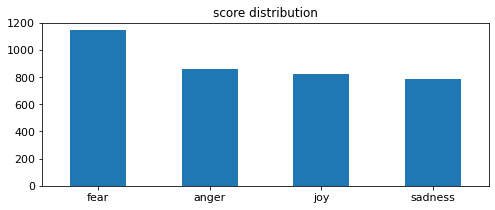

In [226]:
print(train_df.emotion.value_counts())

# plot barchart for X_sample
train_df.emotion.value_counts().plot(kind = 'bar',
                                    title = 'score distribution',
                                    ylim = [0, 1200],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

fear       110
anger       84
joy         79
sadness     74
Name: emotion, dtype: int64


<AxesSubplot:title={'center':'score distribution'}>

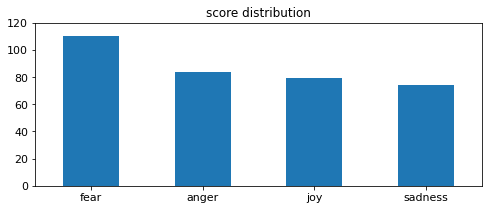

In [227]:
print(test_df.emotion.value_counts())

# plot barchart for X_sample
test_df.emotion.value_counts().plot(kind = 'bar',
                                    title = 'score distribution',
                                    ylim = [0, 120],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

You can use following command to see other available styles to prettify your charts.
```python
print(plt.style.available)```

In [228]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


---

### >>> **Exercise 7 (5 min):**
Notice that for the `ylim` parameters we hardcoded the maximum value for y. Is it possible to automate this instead of hard-coding it? How would you go about doing that? (Hint: look at code above for clues)

In [229]:
upper_bound_df = max(train_df.emotion.value_counts()) + 100

fear       1147
anger       857
joy         823
sadness     786
Name: emotion, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

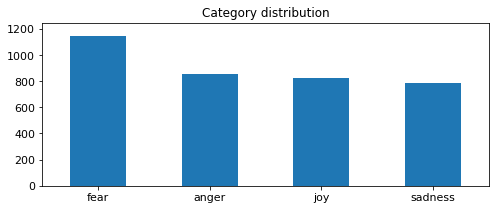

In [230]:
# Answer here

# plot barchart for X_sample
print(train_df.emotion.value_counts())

# plot barchart for X_sample
train_df.emotion.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, upper_bound_df],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

---

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

In [231]:
# Answer here
df_score_counts = pd.concat([train_df.emotion.value_counts(), 
                             test_df.emotion.value_counts()], 
                            axis = 1, 
                            ignore_index=True, 
                            sort=False).rename(columns = {0:"train_df", 1:"test_df"})
df_score_counts

,train_df,test_df
fear,1147,110
anger,857,84
joy,823,79
sadness,786,74


<AxesSubplot:title={'center':'Score distribution'}>

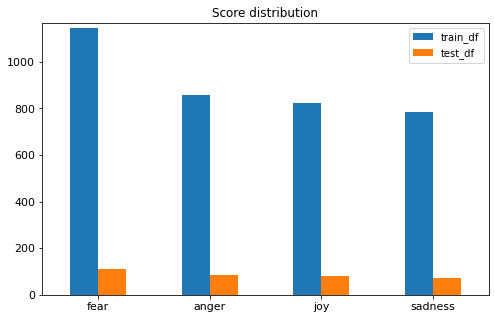

In [232]:
df_score_upper_bound = max(df_score_counts.train_df) + 20
df_score_counts.plot(kind = 'bar', 
                     title = 'Score distribution',
                     ylim = [0, df_score_upper_bound], 
                     rot = 0, fontsize = 11, figsize = (8,5))

One thing that stood out from the both datasets, is that the distribution of the categories remain relatively the same, which is a good sign for us data scientist. There are many ways to conduct sampling on the dataset and still obtain a representative enough dataset. That is not the main focus in this notebook, but if you would like to know more about sampling and how the `sample` feature works, just reference the Pandas documentation and you will find interesting ways to conduct more advanced sampling.

---

### 5.2 Feature Creation
The other operation from the list above that we are going to practise on is the so-called feature creation. As the name suggests, in feature creation we are looking at creating new interesting and useful features from the original dataset; a feature which captures the most important information from the raw information we already have access to. In our `train_df` table, we would like to create some features from the `text` field, but we are still not sure what kind of features we want to create. We can think of an interesting problem we want to solve, or something we want to analyze from the data, or some questions we want to answer. This is one process to come up with features -- this process is usually called `feature engineering` in the data science community. 

We know what feature creation is so let us get real involved with our dataset and make it more interesting by adding some special features or attributes if you will. First, we are going to obtain the **unigrams** for each text. (Unigram is just a fancy word we use in Text Mining which stands for 'tokens' or 'individual words'.) Yes, we want to extract all the words found in each text and append it as a new feature to the pandas dataframe. The reason for extracting unigrams is not so clear yet, but we can start to think of obtaining some statistics about the articles we have: something like **word distribution** or **word frequency**.

Before going into any further coding, we will also introduce a useful text mining library called [NLTK](http://www.nltk.org/). The NLTK library is a natural language processing tool used for text mining tasks, so might as well we start to familiarize ourselves with it from now (It may come in handy for the final project!). In partcular, we are going to use the NLTK library to conduct tokenization because we are interested in splitting a sentence into its individual components, which we refer to as words, emojis, emails, etc. So let us go for it! We can call the `nltk` library as follows:

```python
import nltk
```

In [233]:
import nltk

In [234]:
# takes a like a minute or two to process
train_df['unigrams'] = train_df['text'].apply(lambda x: dmh.tokenize_text(x))


In [235]:
train_df[0:4]["unigrams"]

0    [Contactless, affliction, kart, are, the, need...
1    [@, camilluddington, the, fact, that, YOURE, n...
2    [New, play, through, tonight, !, Pretty, much,...
3    [@, EurekaForbes, U, got, to, b, kidding, me, ...
Name: unigrams, dtype: object

If you take a closer look at the `train_df` table now, you will see the new columns `unigrams` that we have added. You will notice that it contains an array of tokens, which were extracted from the original `text` field. At first glance, you will notice that the tokenizer is not doing a great job, let us take a closer at a single record and see what was the exact result of the tokenization using the `nltk` library.

In [236]:
train_df[0:4]

,id,text,emotion,intensity,label,unigrams
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need..."
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n..."
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,..."
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ..."


In [237]:
list(train_df[0:1]['unigrams'])

[['Contactless',
  'affliction',
  'kart',
  'are',
  'the',
  'needs',
  'must',
  'regarding',
  'the',
  'psychological',
  'moment',
  '!',
  ':',
  'xbeUJGB']]

In [238]:
from nltk.corpus import stopwords

text_wo_stopwords_df = []
for item in train_df["unigrams"]:
     text_wo_stopwords_df.append(" ".join([term.lower() for term in item 
                                           if term.lower() not in stopwords.words("english")]))


In [239]:
train_df["text_wo_stopwords"] = text_wo_stopwords_df

In [240]:
train_df[0:4]

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n...",@ camilluddington fact youre nervous makes wan...
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,...",new play tonight ! pretty much blind run . pla...
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ...",@ eurekaforbes u got b kidding . anu firm resp...


The `nltk` library does a pretty decent job of tokenizing our text. There are many other tokenizers online, such as [spaCy](https://spacy.io/), and the built in libraries provided by [scikit-learn](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html). We are making use of the NLTK library because it is open source and because it does a good job of segmentating text-based data. 

---

### 5.3 Feature subset selection
Okay, so we are making some headway here. Let us now make things a bit more interesting. We are going to do something different from what we have been doing thus far. We are going use a bit of everything that we have learned so far. Briefly speaking, we are going to move away from our main dataset (one form of feature subset selection), and we are going to generate a document-term matrix from the original dataset. In other words we are going to be creating something like this. 

![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vS01RrtPHS3r1Lf8UjX4POgDol-lVF4JAbjXM3SAOU-dOe-MqUdaEMWwJEPk9TtiUvcoSqTeE--lNep/pub?w=748&h=366)

Initially, it won't have the same shape as the table above, but we will get into that later. For now, let us use scikit learn built in functionalities to generate this document. You will see for yourself how easy it is to generate this table without much coding. 

In [241]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
df_counts = count_vect.fit_transform(train_df.text)

What we did with those two lines of code is that we transorfmed the articles into a **term-document matrix**. Those lines of code tokenize each article using a built-in, default tokenizer (often referred to as an `analzyer`) and then produces the word frequency vector for each document. We can create our own analyzers or even use the nltk analyzer that we previously built. To keep things tidy and minimal we are going to use the default analyzer provided by `CountVectorizer`. Let us look closely at this analyzer. 

In [242]:
analyze = count_vect.build_analyzer()
analyze("Hello World!")
#" ".join(list(X[4:5].text))

['hello', 'world']

---

### **>>> Exercise 9 (5 min):**
Let's analyze the first record of our X dataframe with the new analyzer we have just built. Go ahead try it!

In [243]:
train_df[0:1]

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...


In [244]:
# Answer here
analyze(train_df['text'][0])

['contactless',
 'affliction',
 'kart',
 'are',
 'the',
 'needs',
 'must',
 'regarding',
 'the',
 'psychological',
 'moment',
 'xbeujgb']

---

Now let us look at the term-document matrix we built above.

In [245]:
# We can check the shape of this matrix by:
df_counts.shape

(3613, 10115)

In [246]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names()[0:10]

['00', '000', '00pm', '00tiffanyr', '01', '02', '03', '0303', '034', '04']

![alt txt](https://i.imgur.com/57gA1sd.png)

Above we can see the features found in the all the documents `train_df`, which are basically all the terms found in all the documents. As I said earlier, the transformation is not in the pretty format (table) we saw above -- the term-document matrix. We can do many things with the `count_vect` vectorizer and its transformation `X_counts`. You can find more information on other cool stuff you can do with the [CountVectorizer](http://scikit-learn.org/stable/modules/feature_extraction.html#text-feature-extraction). 

Now let us try to obtain something that is as close to the pretty table I provided above. Before jumping into the code for doing just that, it is important to mention that the reason for choosing the `fit_transofrm` for the `CountVectorizer` is that it efficiently learns the vocabulary dictionary and returns a term-document matrix.

In the next bit of code, we want to extract the first five articles and transform them into document-term matrix, or in this case a 2-dimensional array. Here it goes. 

In [247]:
train_df[0:5]

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n...",@ camilluddington fact youre nervous makes wan...
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,...",new play tonight ! pretty much blind run . pla...
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ...",@ eurekaforbes u got b kidding . anu firm resp...
4,20313.0,"In addition to fiction, wish me luck on my res...",fear,0.620,1,"[In, addition, to, fiction, ,, wish, me, luck,...","addition fiction , wish luck research paper se..."


In [248]:
# we convert from sparse array to normal array
1 in df_counts[10:12, 0:100].toarray()

False

In [249]:
# we convert from sparse array to normal array
df_counts[10:12, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

As you can see the result is just this huge sparse matrix, which is computationally intensive to generate and difficult to visualize. But we can see that the `11th` record, specifically, contains a `1` in the beginning, which from our feature names we can deduce that this article contains exactly one `00` term.

---

### **>>> Exercise 10 (take home):**
**different dataset, we will try to lookup 1st `1` at the `11th` record represents which term.**

In [250]:
import numpy as np
np.where(df_counts[11, 0:].toarray() == 1)

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([ 531,  994, 1219, 3298, 3369, 3723, 3930, 7032, 8232, 8261, 9804]))

In [251]:
train_df.text[11]

'Go follow #beautiful #Snowgang ♥@Amynicolehill12 ♥ #Princess #fitness #bodyposi #haircut #smile #Whitegirlwednesday'

In [252]:
# Answer here
idx_2nd_1 = np.where(df_counts[11, 0:].toarray() == 1)[1][0]
print(f'the word of this 1 represents from the vocabulary is: \
{count_vect.get_feature_names()[idx_2nd_1]}')

the word of this 1 represents from the vocabulary is: amynicolehill12


---

We can also use the vectorizer to generate word frequency vector for new documents or articles. Let us try that below:

In [253]:
count_vect.transform(['Something completely new.']).toarray()

array([[0, 0, 0, ..., 0, 0, 0]])

Now let us put a `00` in the document to see if it is detected as we expect. 

In [254]:
count_vect.transform(['00 Something completely new.']).toarray()

array([[1, 0, 0, ..., 0, 0, 0]])

Impressive, huh!

To get you started in thinking about how to better analyze your data or transformation, let us look at this nice little heat map of our term-document matrix. It may come as a surpise to see the gems you can mine when you start to look at the data from a different perspective. Visualization are good for this reason.

In [255]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names()[0:20]]

In [256]:
plot_x

['term_00',
 'term_000',
 'term_00pm',
 'term_00tiffanyr',
 'term_01',
 'term_02',
 'term_03',
 'term_0303',
 'term_034',
 'term_04',
 'term_08',
 'term_080',
 'term_09',
 'term_095',
 'term_10',
 'term_100',
 'term_1000',
 'term_100000000',
 'term_100g',
 'term_100k']

In [257]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(train_df.index)[0:20]]

In [258]:
plot_z = df_counts[0:20, 0:20].toarray()

For the heat map, we are going to use another visualization library called `seaborn`. It's built on top of matplotlib and closely integrated with pandas data structures. One of the biggest advantages of seaborn is that its default aesthetics are much more visually appealing than matplotlib. See comparison below.

![alt txt](https://i.imgur.com/1isxmIV.png)

The other big advantage of seaborn is that seaborn has some built-in plots that matplotlib does not support. Most of these can eventually be replicated by hacking away at matplotlib, but they’re not built in and require much more effort to build.

So without further ado, let us try it now!

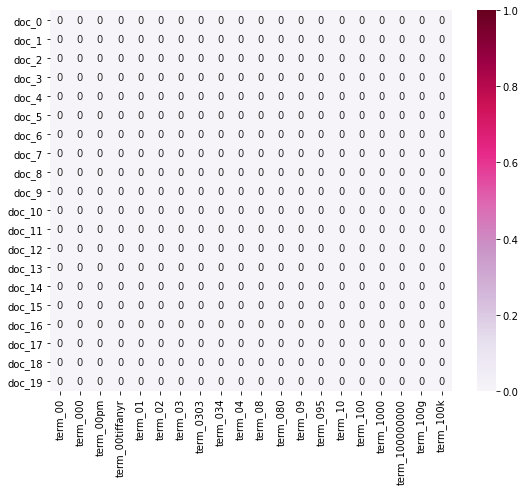

In [259]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

### **<<< discuss**
from this figure, we can be told the terms matrix is a sparse vectory.

Check out more beautiful color palettes here: https://python-graph-gallery.com/197-available-color-palettes-with-matplotlib/

---

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

### **<<< Solution for Exercise 11:**

Since the term vectory is sparse, only retrive top N term will be reasonable. To avoid noise from rarely occuring words and reduce the size of the vectors, we remove any feature with a count below a threshold of $log10(Σ)$ where $Σ$ is the sum of all feature counts in the vector.

each doc term vectory only remain those TOP N terms, that make plot entile term-document matrix work out get a nice and useful visualization.

additional, we sample the entire doc. for more convince plot. 

In [260]:
# do array transpose for easy sum()
df_counts_transpose = df_counts.transpose()

In [261]:
# need consume some time to finish, due to the high dimensional data
import math
from tqdm import tqdm

counts_term = {count_vect.get_feature_names()[idx]: sum(item.toarray()[0]) 
                 for idx, item in tqdm(enumerate(df_counts_transpose))}

10115it [00:35, 281.52it/s]


In [262]:
counts_threshold = int(math.log(sum(counts_term.values())))
counts_threshold_term = [term for term in counts_term if counts_term[term] > counts_threshold]
counts_threshold_term_idx = [count_vect.get_feature_names().index(term) for term in counts_threshold_term]

df_counts_counts_threshold_term = [[item[idx] for idx in counts_threshold_term_idx] 
                                  for item in df_counts.toarray()]

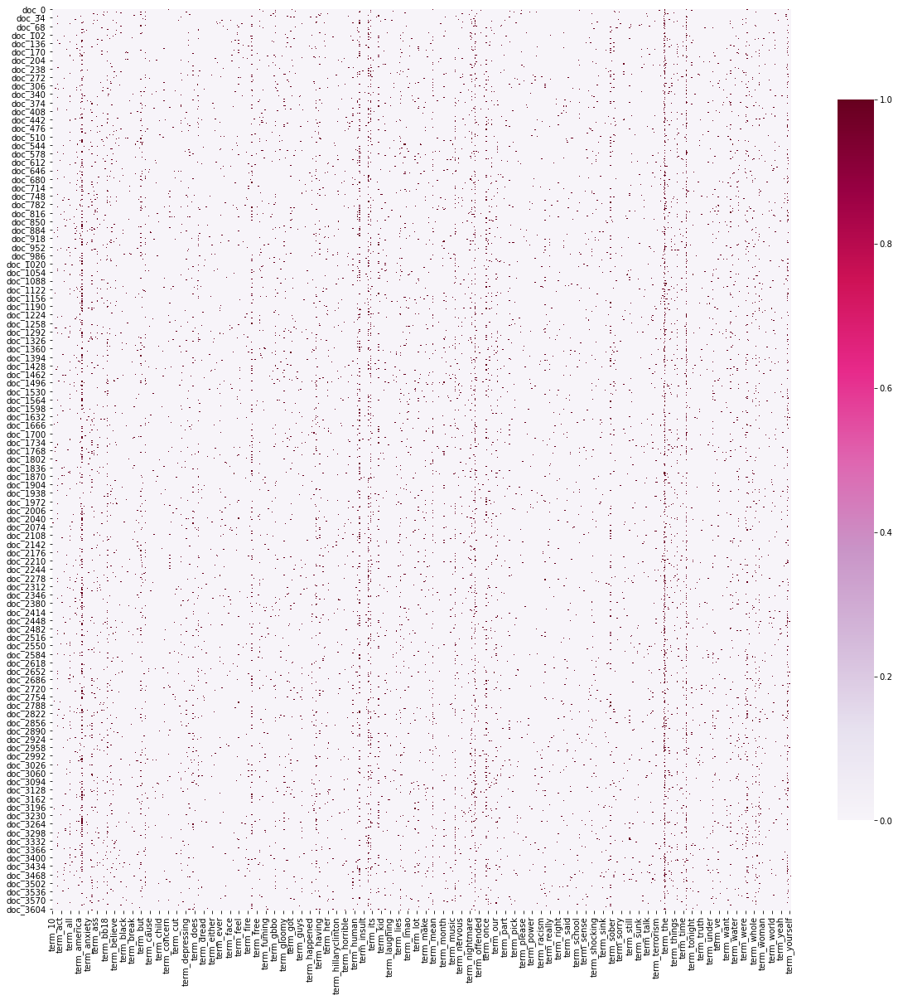

In [263]:
import seaborn as sns

df_todraw_ex = pd.DataFrame(np.array(df_counts_counts_threshold_term),
                            columns = [f'term_{str(i)}' for i in counts_threshold_term], 
                            index = [f'doc_{str(i)}' for i in list(train_df.index)[0:]])

plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw_ex,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False, cbar_kws={"shrink": .8})

### solution 2: sample the entire doc. for more convince plot.

In [264]:
df_todraw_ex["emotion"] = train_df.emotion.values

df_todraw_ex_sample = df_todraw_ex.sample(n = 100)

In [265]:
df_todraw_ex["emotion"].value_counts()

fear       1147
anger       857
joy         823
sadness     786
Name: emotion, dtype: int64

In [266]:
df_todraw_ex_sample["emotion"].value_counts()

fear       33
anger      28
joy        20
sadness    19
Name: emotion, dtype: int64

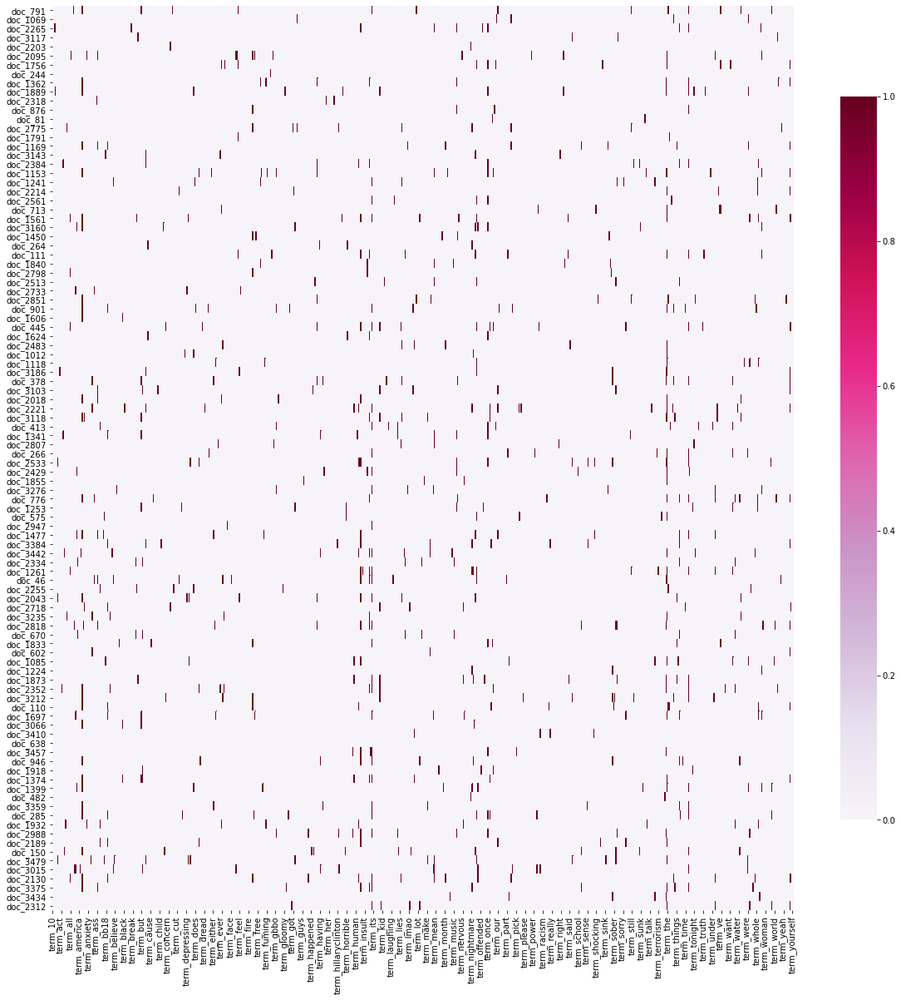

In [267]:
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw_ex_sample.drop(columns=["emotion"]),
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False, cbar_kws={"shrink": .8})

---

The great thing about what we have done so far is that we now open doors to new problems. Let us be optimistic. Even though we have the problem of sparsity and a very high dimensional data, we are now closer to uncovering wonders from the data. You see, the price you pay for the hard work is worth it because now you are gaining a lot of knowledge from what was just a list of what appeared to be irrelevant articles. Just the fact that you can blow up the data and find out interesting characteristics about the dataset in just a couple lines of code, is something that truly inspires me to practise Data Science. That's the motivation right there!

---

### 5.4 Dimensionality Reduction
Since we have just touched on the concept of sparsity most naturally the problem of "curse of dimentionality" comes up. I am not going to get into the full details of what dimensionality reduction is and what it is good for just the fact that is an excellent technique for visualizing data efficiently (please refer to notes for more information). All I can say is that we are going to deal with the issue of sparsity with a few lines of code. And we are going to try to visualize our data more efficiently with the results.

We are going to make use of Principal Component Analysis to efficeintly reduce the dimensions of our data, with the main goal of "finding a projection that captures the largest amount of variation in the data." This concept is important as it is very useful for visualizing and observing the characteristics of our dataset. 

[PCA Algorithm](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Input:** Raw term-vector matrix

**Output:** Projections 

In [268]:
from sklearn.decomposition import PCA

In [269]:
df_reduced = PCA(n_components = 2).fit_transform(df_counts.toarray())

In [270]:
df_reduced.shape

(3613, 2)

In [271]:
df_reduced

array([[ 1.16297333, -0.84325442],
       [ 0.59124104,  0.32106235],
       [ 0.34388608, -0.23469553],
       ...,
       [-0.69840581, -0.44910207],
       [ 0.35583028, -0.56363524],
       [-0.41973139, -0.48940393]])

In [272]:
label_ = [0, 1, 2, 3]

In [273]:
train_df.label.value_counts()

1    1147
0     857
2     823
3     786
Name: label, dtype: int64

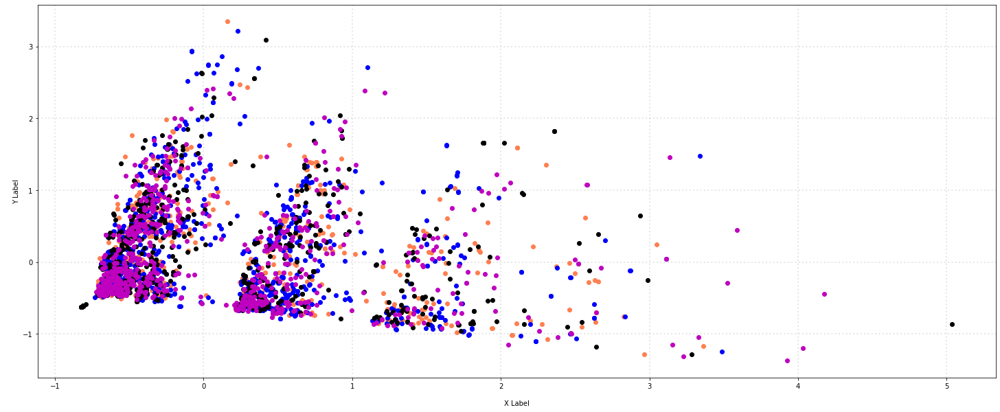

In [274]:
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(figsize = (25,10))
ax = fig.subplots()

for c, label in zip(col, label_):
    xs = df_reduced[train_df['label'] == label].T[0]
    ys = df_reduced[train_df['label'] == label].T[1]
   
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')

plt.show()

From the 2D visualization above, we can see a slight "hint of separation in the data"; i.e., they might have some special grouping by category, but it is not immediately clear. The PCA was applied to the raw frequencies and this is considered a very naive approach as some words are not really unique to a document. Only categorizing by word frequency is considered a "bag of words" approach. Later on in the course you will learn about different approaches on how to create better features from the term-vector matrix, such as term-frequency inverse document frequency so-called TF-IDF.

---

### >>> Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

### <<< Answer
by different angle, we can see major parts of different category that ever been masked.

although there are some outliers, but most elements of 4 category are nearby.

In [275]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D


In [276]:
df_reduced_ex = PCA(n_components = 3).fit_transform(df_counts.toarray())

In [277]:
df_reduced_ex.shape

(3613, 3)

In [278]:
label_

[0, 1, 2, 3]

In [279]:
df_reduced_ex

array([[ 1.16297479, -0.84323697,  0.07851412],
       [ 0.59123444,  0.32110584, -0.36795488],
       [ 0.34388595, -0.23467839,  0.08435426],
       ...,
       [-0.69840499, -0.44908487, -0.12520682],
       [ 0.35583122, -0.56361505, -0.23096299],
       [-0.41972853, -0.48938368, -0.06127861]])

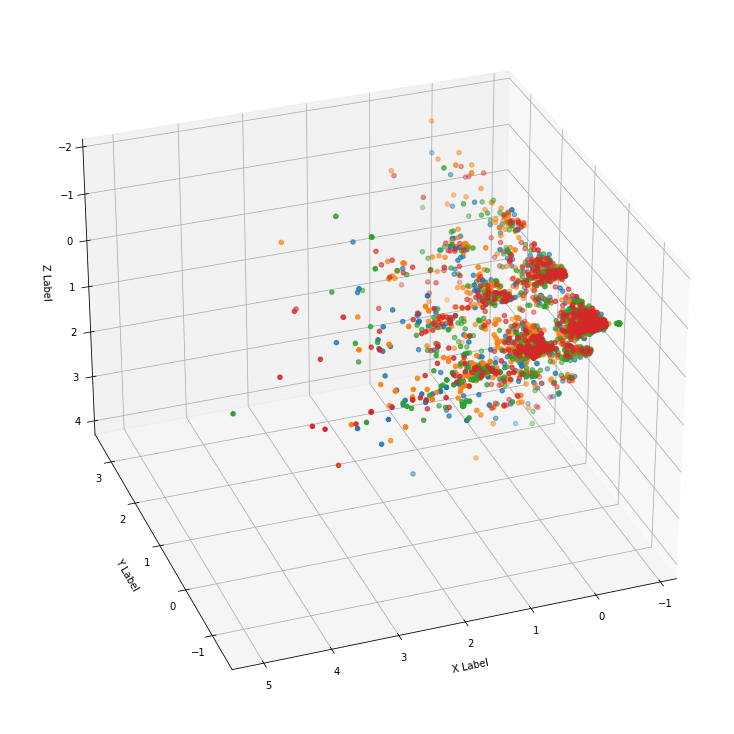

In [280]:
#col = ['coral', 'blue']
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-150, azim=110)

for c, label in zip(col, label_):
    xs = df_reduced_ex[train_df['label'] == label].T[0]
    ys = df_reduced_ex[train_df['label'] == label].T[1]
    zs = df_reduced_ex[train_df['label'] == label].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

plt.show()

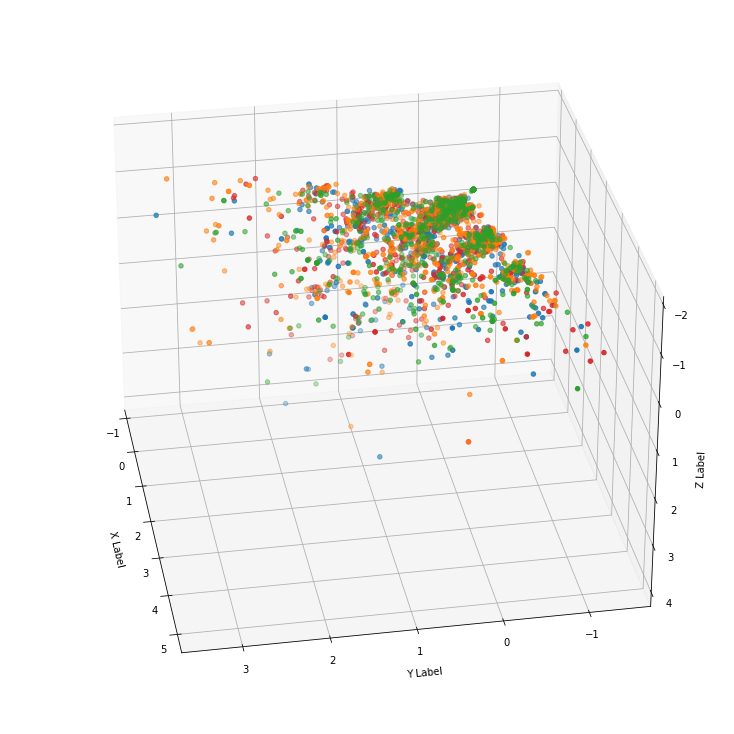

In [281]:
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-150, azim=190)

for c, label in zip(col, label_):
    xs = df_reduced_ex[train_df['label'] == label].T[0]
    ys = df_reduced_ex[train_df['label'] == label].T[1]
    zs = df_reduced_ex[train_df['label'] == label].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

plt.show()

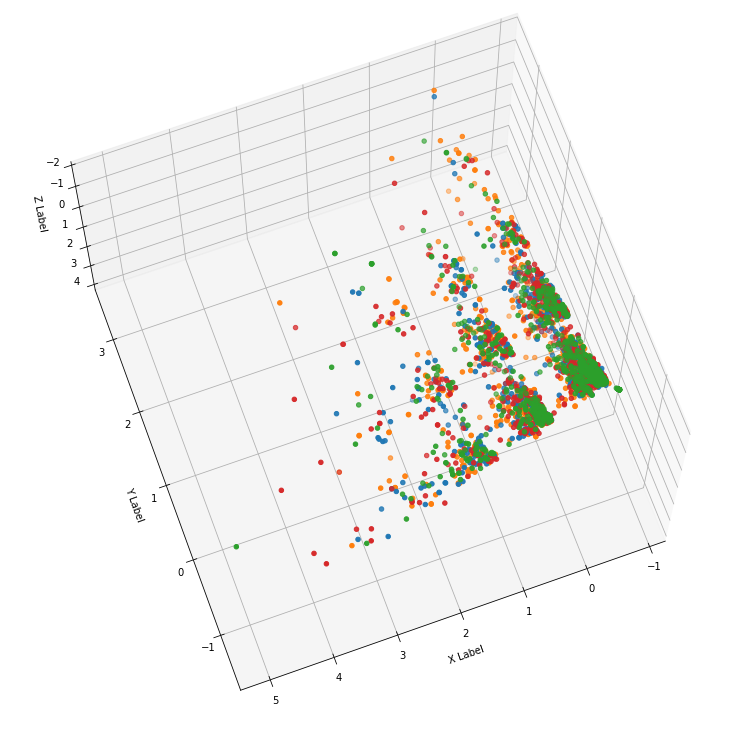

In [282]:
col = ['coral', 'blue', 'black', 'm']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-110, azim=110)

for c, label in zip(col, label_):
    xs = df_reduced_ex[train_df['label'] == label].T[0]
    ys = df_reduced_ex[train_df['label'] == label].T[1]
    zs = df_reduced_ex[train_df['label'] == label].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

plt.show()

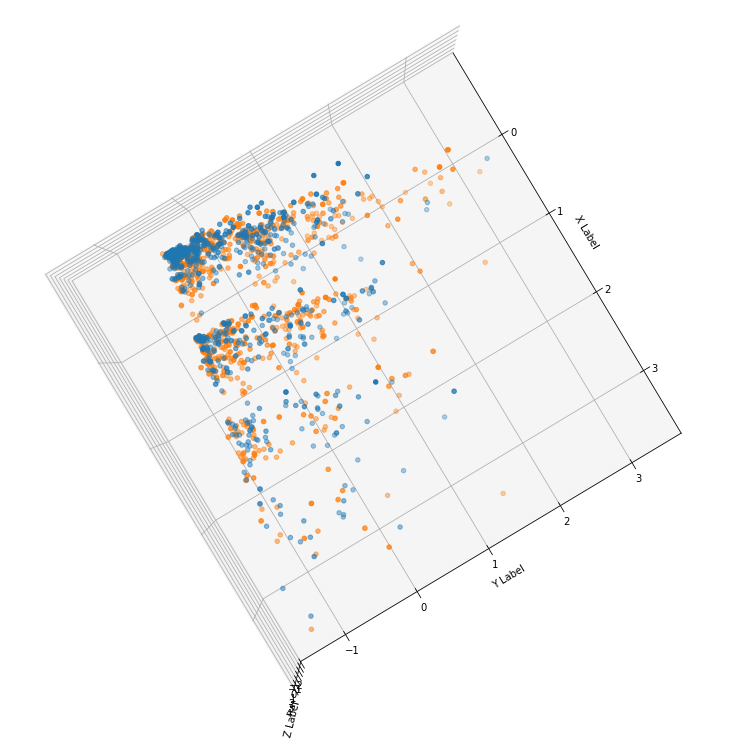

In [283]:
# Axis of rotation and save figures for review.
col = ['coral', 'blue']

# plot
fig = plt.figure(1, figsize = (25,10))
#plt.clf()
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax = Axes3D(fig, elev=-110, azim=110)

for c, label in zip(col, label_):
    xs = df_reduced_ex[train_df['label'] == label].T[0]
    ys = df_reduced_ex[train_df['label'] == label].T[1]
    zs = df_reduced_ex[train_df['label'] == label].T[2]   
    ax.scatter(xs, ys, zs, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')


for i in range(0,360,30):
    ax.view_init(elev=10., azim=i)
    plt.savefig(f"./img/new_data/movie_{i:0=3}.png")

for i in range(0,360,30):
    ax.view_init(elev=-10., azim=i)
    plt.savefig(f"./img/new_data/movie_elev-10_{i:0=3}.png")
    

for i in range(0,360,30):
    ax.view_init(elev=90., azim=i)
    plt.savefig(f"./img/new_data/movie_elev+90_{i:0=3}.png")

---

### 5.5 Atrribute Transformation / Aggregation
We can do other things with the term-vector matrix besides applying dimensionalaity reduction technique to deal with sparsity problem. Here we are going to generate a simple distribution of the words found in all the entire set of articles. Intuitively, this may not make any sense, but in data science sometimes we take some things for granted, and we just have to explore the data first before making any premature conclusions. On the topic of attribute transformation, we will take the word distribution and put the distribution in a scale that makes it easy to analyze patterns in the distrubution of words. Let us get into it!

First, we need to compute these frequencies for each term in all documents. Visually speaking, we are seeking to add values of the 2D matrix, vertically; i.e., sum of each column. You can also refer to this process as aggregation, which we won't explore further in this notebook because of the type of data we are dealing with. But I believe you get the idea of what that includes.  

![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vTMfs0zWsbeAl-wrpvyCcZqeEUf7ggoGkDubrxX5XtwC5iysHFukD6c-dtyybuHnYigiRWRlRk2S7gp/pub?w=750&h=412)

In [284]:
# note this takes time to compute. You may want to reduce the amount of terms 
# you want to compute frequencies for
#term_frequencies = []
#for j in tqdm(range(0,df_counts.shape[1])):
#    term_frequencies.append(sum(df_counts[:,j].toarray()))

In [285]:
#term_frequencies = np.asarray(df_counts.sum(axis=0))[0]

### Prefer to use transposed array that is more efficient.

In [286]:
# note this takes time to compute. You may want to reduce the amount of terms 
# you want to compute frequencies for
term_frequencies = []
for item in tqdm(df_counts_transpose):
    term_frequencies.append(sum(item.toarray()[0]))

10115it [00:05, 1793.07it/s]


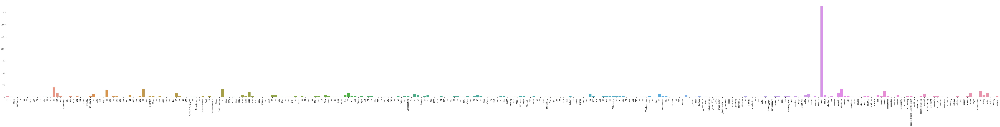

In [287]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names()[:300], rotation = 90);

---

### >>> **Exercise 13 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

/Applications/anaconda/envs/py38/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:31: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




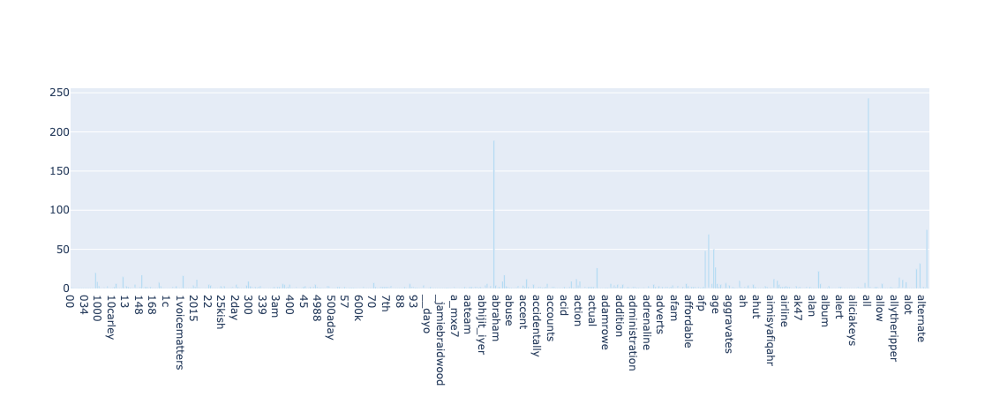

In [288]:
import plotly
import plotly.graph_objs as go
from plotly.tools import FigureFactory as ff
import numpy as np   # So we can use random numbers in examples

# Must enable in order to use plotly off-line (vs. in the cloud... hate cloud)
plotly.offline.init_notebook_mode()

#table_plotly = ff.create_table(pd.DataFrame({"term":count_vect.get_feature_names()[:300],
#                                            "frequency":term_frequencies[:300]}))
#plotly.offline.iplot(table_plotly, filename='./img/new_data/table')

trace_a = go.Bar(x=count_vect.get_feature_names()[:500],
                 y=term_frequencies[:500],
                 name='Term Frequency',
                 marker=dict(color='#A2D5F2'))

data_plotly = go.Data([trace_a])

#data3 = [go.Bar(x=df_inaug.Year, y=df_inaug.America)]

plotly.offline.iplot(data_plotly, filename='./img/new_data/basic_bar')

---

### >>> **Exercise 14 (take home):** 
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


### <<< Answer here

like what ever done previous >>> Since the term vectory is sparse, only retrive top N term will be reasonable. To avoid noise from rarely occuring words and reduce the size of the vectors, we remove any feature with a count below a threshold of  log10(Σ)  where  Σ  is the sum of all feature counts in the vector.

each doc term vectory only remain those TOP N terms, that make plot entile term-document matrix work out get a nice and useful visualization. 

In [289]:
# need consume some time to finish, due to the high dimensional data

import math
from collections import Counter

counts_threshold = int(math.log(sum(term_frequencies)))
counts_threshold_term_frequencies = {term:term_frequencies[idx] 
                          for idx, term in enumerate(count_vect.get_feature_names()) 
                                     if term_frequencies[idx] > counts_threshold}

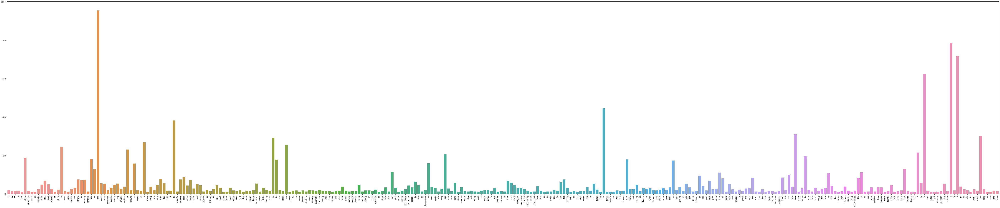

In [290]:
plt.subplots(figsize=(100, 20))
g = sns.barplot(x=list(counts_threshold_term_frequencies.keys())[:300],
                y=list(counts_threshold_term_frequencies.values())[:300])
g.set_xticklabels(list(counts_threshold_term_frequencies.keys())[:300], rotation = 90);

---

### >>> **Exercise 15 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

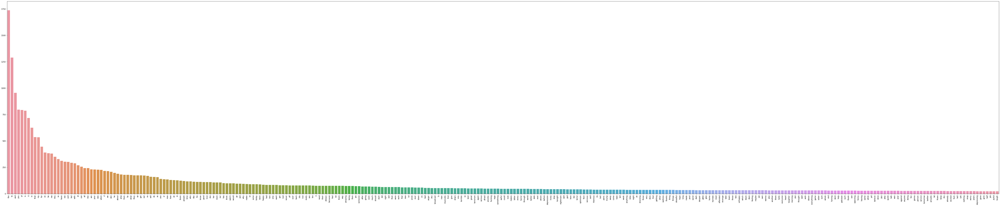

In [291]:
# Answer here
counts_threshold_term_frequencies_sorted = {k: v 
                                            for k, v in sorted(counts_threshold_term_frequencies.items(), 
                                                               key=lambda item: item[1], 
                                                               reverse=True)}
plt.subplots(figsize=(100, 20))
g = sns.barplot(x=list(counts_threshold_term_frequencies_sorted.keys())[:300],
                y=list(counts_threshold_term_frequencies_sorted.values())[:300])
g.set_xticklabels(list(counts_threshold_term_frequencies_sorted.keys())[:300], rotation = 90);

---

Since we already have those term frequencies, we can also transform the values in that vector into the log distribution. All we need is to import the `math` library provided by python and apply it to the array of values of the term frequency vector. This is a typical example of attribute transformation. Let's go for it. The log distribution is a technique to visualize the term frequency into a scale that makes you easily visualize the distribution in a more readable format. In other words, the variations between the term frequencies are now easy to observe. Let us try it out!

In [292]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

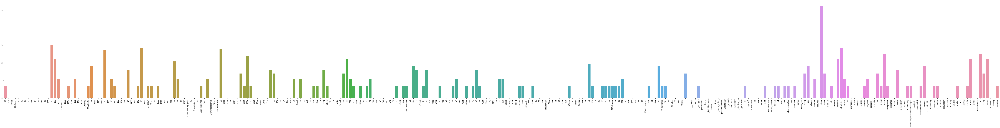

In [293]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names()[:300], rotation = 90);

Besides observing a complete transformation on the disrtibution, notice the scale on the y-axis. The log distribution in our unsorted example has no meaning, but try to properly sort the terms by their frequency, and you will see an interesting effect. Go for it!

---

### 5.6 Discretization and Binarization
In this section we are going to discuss a very important pre-preprocessing technique used to transform the data, specifically categorical values, into a format that satisfies certain criteria required by particular algorithms. Given our current original dataset, we would like to transform one of the attributes, `category_name`, into four binary attributes. In other words, we are taking the category name and replacing it with a `n` asymmetric binary attributes. The logic behind this transformation is discussed in detail in the recommended Data Mining text book (please refer to it on page 58). People from the machine learning community also refer to this transformation as one-hot encoding, but as you may become aware later in the course, these concepts are all the same, we just have different prefrence on how we refer to the concepts. Let us take a look at what we want to achieve in code. 

### **For this exercise, we will add a new column for store str() type of score **


In [294]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [295]:
mlb = preprocessing.LabelBinarizer()

In [296]:
mlb.fit(train_df.label)

LabelBinarizer()

In [297]:
mlb.classes_

array([0, 1, 2, 3])

In [298]:
train_df['bin_label'] = mlb.transform(train_df['label']).tolist()

In [299]:
train_df[0:9]

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords,bin_label
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...,"[0, 0, 0, 1]"
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n...",@ camilluddington fact youre nervous makes wan...,"[0, 1, 0, 0]"
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,...",new play tonight ! pretty much blind run . pla...,"[0, 1, 0, 0]"
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ...",@ eurekaforbes u got b kidding . anu firm resp...,"[0, 1, 0, 0]"
4,20313.0,"In addition to fiction, wish me luck on my res...",fear,0.620,1,"[In, addition, to, fiction, ,, wish, me, luck,...","addition fiction , wish luck research paper se...","[0, 1, 0, 0]"
5,10408.0,@JuliaHB1 Bloody right #fume,anger,0.500,0,"[@, JuliaHB1, Bloody, right, #, fume]",@ juliahb1 bloody right # fume,"[1, 0, 0, 0]"
6,20963.0,Oh I get i see it's #TexasTech playing tonight...,fear,0.292,1,"[Oh, I, get, i, see, it, 's, #, TexasTech, pla...",oh get see 's # texastech playing tonight # te...,"[0, 1, 0, 0]"
7,20386.0,My roommate turns the sink off with her foot t...,fear,0.583,1,"[My, roommate, turns, the, sink, off, with, he...",roommate turns sink foot avoid germs guy says ...,"[0, 1, 0, 0]"
8,20452.0,When someone tells you they're going to 'tear ...,fear,0.542,1,"[When, someone, tells, you, they, 're, going, ...",someone tells 're going 'tear apart ' say 'why...,"[0, 1, 0, 0]"


Take a look at the new attribute we have added to the `X` table. You can see that the new attribute, which is called `bin_category`, contains an array of 0's and 1's. The `1` is basically to indicate the position of the label or category we binarized. If you look at the first two records, the one is places in slot 2 in the array; this helps to indicate to any of the algorithms which we are feeding this data to, that the record belong to that specific category. 

Attributes with **continuous values** also have strategies to tranform the data; this is usually called **Discretization** (please refer to the text book for more inforamation).

---

### >>> **Exercise 16 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [300]:
mlb_ex = preprocessing.LabelBinarizer()

In [301]:
mlb_ex.fit(train_df.emotion)

LabelBinarizer()

In [302]:
mlb_ex.classes_

array(['anger', 'fear', 'joy', 'sadness'], dtype='<U7')

In [303]:
train_df['bin_emotion'] = mlb_ex.transform(train_df["emotion"]).tolist()

In [304]:
train_df[0:9]

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords,bin_label,bin_emotion
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n...",@ camilluddington fact youre nervous makes wan...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,...",new play tonight ! pretty much blind run . pla...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ...",@ eurekaforbes u got b kidding . anu firm resp...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
4,20313.0,"In addition to fiction, wish me luck on my res...",fear,0.620,1,"[In, addition, to, fiction, ,, wish, me, luck,...","addition fiction , wish luck research paper se...","[0, 1, 0, 0]","[0, 1, 0, 0]"
5,10408.0,@JuliaHB1 Bloody right #fume,anger,0.500,0,"[@, JuliaHB1, Bloody, right, #, fume]",@ juliahb1 bloody right # fume,"[1, 0, 0, 0]","[1, 0, 0, 0]"
6,20963.0,Oh I get i see it's #TexasTech playing tonight...,fear,0.292,1,"[Oh, I, get, i, see, it, 's, #, TexasTech, pla...",oh get see 's # texastech playing tonight # te...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
7,20386.0,My roommate turns the sink off with her foot t...,fear,0.583,1,"[My, roommate, turns, the, sink, off, with, he...",roommate turns sink foot avoid germs guy says ...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
8,20452.0,When someone tells you they're going to 'tear ...,fear,0.542,1,"[When, someone, tells, you, they, 're, going, ...",someone tells 're going 'tear apart ' say 'why...,"[0, 1, 0, 0]","[0, 1, 0, 0]"


---

# 6. Data Exploration

Sometimes you need to take a peek at your data to understand the relationships in your dataset. Here, we will focus in a similarity example. Let's take 3 documents and compare them.

In [305]:
# We retrieve 2 sentences for a random record, here, indexed at 50 and 100
document_to_transform_1 = []
random_record_1 = train_df.iloc[50]
random_record_1 = random_record_1['text']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = train_df.iloc[100]
random_record_2 = random_record_2['text']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = train_df.iloc[150]
random_record_3 = random_record_3['text']
document_to_transform_3.append(random_record_3)

Let's look at our emails.

In [306]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['Turkish exhilaration: for a 30% shade off irruptive russian visitors this twelvemonth, gobbler is nephalism so...']
['ordered my vacation bathing suits. one less thing to fret about.']
["@MalYoung @AngelicaMcD I hope to now see some levity, light, romance and happiness come Stitch and Abby's way after such a long hard road."]


In [307]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vecors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [308]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})

Cosine Similarity using count bw 1 and 2: 0.000000
Cosine Similarity using count bw 1 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000


As expected, cosine similarity between a sentence and itself is 1. Between 2 entirely different sentences, it will be 0. 

We can assume that we have the more common features in bthe documents 1 and 3 than in documents 1 and 2. This reflects indeed in a higher similarity than that of sentences 1 and 3. 


---

## 7. Concluding Remarks

Wow! We have come a long way! We can now call ourselves experts of Data Preprocessing. You should feel excited and proud because the process of Data Mining usually involves 70% preprocessing and 30% training learning models. You will learn this as you progress in the Data Mining course. I really feel that if you go through the exercises and challenge yourself, you are on your way to becoming a super Data Scientist. 

From here the possibilities for you are endless. You now know how to use almost every common technique for preprocessing with state-of-the-art tools, such as as Pandas and Scikit-learn. You are now with the trend! 

After completing this notebook you can do a lot with the results we have generated. You can train algorithms and models that are able to classify articles into certain categories and much more. You can also try to experiment with different datasets, or venture further into text analytics by using new deep learning techniques such as word2vec. All of this will be presented in the next lab session. Until then, go teach machines how to be intelligent to make the world a better place. 

----

## . References

- Pandas cook book ([Recommended for starters](http://pandas.pydata.org/pandas-docs/stable/cookbook.html))
- [Pang-Ning Tan, Michael Steinbach, Vipin Kumar, Introduction to Data Mining, Addison Wesley](https://dl.acm.org/citation.cfm?id=1095618)

# Part 3: New tasks on the new dataset

**Third:** please attempt the following tasks on the new dataset. This part is worth 30% of your grade.
- Generate meaningful new data visualizations. Refer to online resources and the Data Mining textbook for inspiration and ideas.
- Generate TF-IDF features from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn guide .
- Implement a simple Naive Bayes classifier that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences. Refer to this article.

## . Generate meaningful new data visualizations. 

### >>> notes of solution: consider the dataset only have sentence and score 2 attributes, and no missing value, belong to quite simplicity and clear data set. By previous sections, the bar plot have been presented and we can see not much inspiration. So, I will like to try Wordcloud to see positive and negative score have what kind of terms. 
- plot all terms
- seperate to plot score 1 & 0 by original sentence.
- seperate to plot score 1 & 0 by text without stopwords.

In [309]:
train_df.head()

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords,bin_label,bin_emotion
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n...",@ camilluddington fact youre nervous makes wan...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,...",new play tonight ! pretty much blind run . pla...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ...",@ eurekaforbes u got b kidding . anu firm resp...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
4,20313.0,"In addition to fiction, wish me luck on my res...",fear,0.620,1,"[In, addition, to, fiction, ,, wish, me, luck,...","addition fiction , wish luck research paper se...","[0, 1, 0, 0]","[0, 1, 0, 0]"


In [310]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data, title):
    wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()
    
# Transposing document term matrix
#df_dtm=df_dtm.transpose()

# Plotting word cloud for each product
#for index, product in enumerate(df_dtm.columns):
#    generate_wordcloud(df_dtm[product].sort_values(ascending=False), product)

In [311]:
from nltk.corpus import stopwords

counts_term_wo_stopword = {key: values for key, values in counts_term.items() 
                           if key not in stopwords.words("english")}

counts_term_df = pd.DataFrame.from_dict(counts_term, 
                                        orient='index', 
                                        columns=['freq'])

counts_term_wo_stopword_df = pd.DataFrame.from_dict(counts_term_wo_stopword, 
                                        orient='index', 
                                        columns=['freq'])

#### **plot all terms by sorting term frequency**
So, those stopwords, such as "the", "and", "is" occupied most space. that can't bring out any important stuffs for reference.

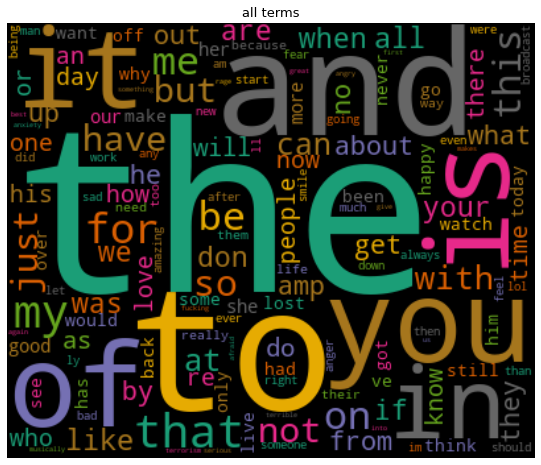

In [312]:
generate_wordcloud(counts_term_df["freq"].sort_values(ascending=False), "all terms")

#### **plot all terms without stopwords by sorting term frequency**
yes, more interested terms pop up. But, how about significant terms for different emotion?

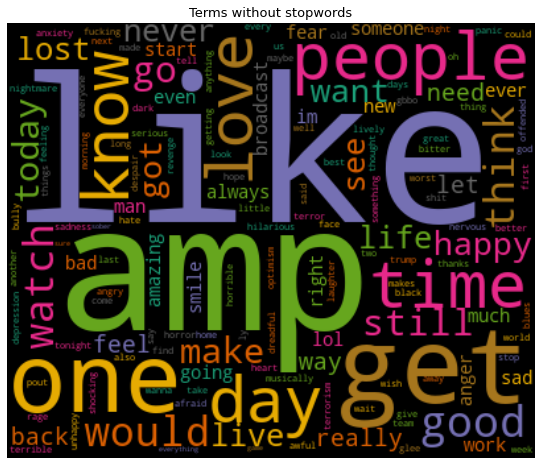

In [313]:
generate_wordcloud(counts_term_wo_stopword_df["freq"].sort_values(ascending=False), 
                   "Terms without stopwords")

In [314]:
train_df.emotion.unique()

array(['sadness', 'fear', 'anger', 'joy'], dtype=object)

In [315]:
# do array transpose for easy sum()

idx_score_anger = train_df[train_df["emotion"] == "anger"].index.tolist()
idx_score_fear = train_df[train_df["emotion"] == "fear"].index.tolist()
idx_score_joy = train_df[train_df["emotion"] == "joy"].index.tolist()
idx_score_sadness = train_df[train_df["emotion"] == "sadness"].index.tolist()
df_counts_score_anger = df_counts.toarray()[idx_score_anger]
df_counts_score_fear = df_counts.toarray()[idx_score_fear]
df_counts_score_joy = df_counts.toarray()[idx_score_joy]
df_counts_score_sadness = df_counts.toarray()[idx_score_sadness]
df_counts_score_anger_transpose = df_counts_score_anger.transpose()
df_counts_score_fear_transpose = df_counts_score_fear.transpose()
df_counts_score_joy_transpose = df_counts_score_joy.transpose()
df_counts_score_sadness_transpose = df_counts_score_sadness.transpose()

In [316]:
# need consume some time to finish, due to the high dimensional data
import math
from tqdm import tqdm

counts_term_score_anger = {count_vect.get_feature_names()[idx]: sum(item) 
                 for idx, item in enumerate(df_counts_score_anger_transpose)}
counts_term_score_fear = {count_vect.get_feature_names()[idx]: sum(item) 
                 for idx, item in enumerate(df_counts_score_fear_transpose)}
counts_term_score_joy = {count_vect.get_feature_names()[idx]: sum(item) 
                 for idx, item in enumerate(df_counts_score_joy_transpose)}
counts_term_score_sadness = {count_vect.get_feature_names()[idx]: sum(item) 
                 for idx, item in enumerate(df_counts_score_sadness_transpose)}

In [317]:
counts_term_score_anger_wo_stopword = {key: values for key, values in counts_term_score_anger.items() 
                           if key not in stopwords.words("english")}
counts_term_score_fear_wo_stopword = {key: values for key, values in counts_term_score_fear.items() 
                           if key not in stopwords.words("english")}
counts_term_score_joy_wo_stopword = {key: values for key, values in counts_term_score_joy.items() 
                           if key not in stopwords.words("english")}
counts_term_score_sadness_wo_stopword = {key: values for key, values in counts_term_score_sadness.items() 
                           if key not in stopwords.words("english")}

counts_term_score_anger_wo_stopword_df = pd.DataFrame.from_dict(counts_term_score_anger_wo_stopword, 
                                        orient='index', 
                                        columns=['freq'])
counts_term_score_fear_wo_stopword_df = pd.DataFrame.from_dict(counts_term_score_fear_wo_stopword, 
                                        orient='index', 
                                        columns=['freq'])
counts_term_score_joy_wo_stopword_df = pd.DataFrame.from_dict(counts_term_score_joy_wo_stopword, 
                                        orient='index', 
                                        columns=['freq'])
counts_term_score_sadness_wo_stopword_df = pd.DataFrame.from_dict(counts_term_score_sadness_wo_stopword, 
                                        orient='index', 
                                        columns=['freq'])

#### **plot emotion "anger" column's terms without stopwords by sorting term frequency**
ok, we can see "like" is the most key word at "anger" category that is interested at a positive wording but presented here, that may be the unigram issue. The original sentence may be "like to anger ...", but we only show unigram that make this issue.

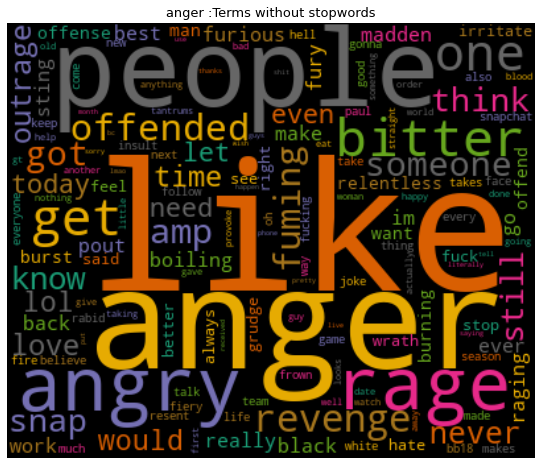

In [318]:
generate_wordcloud(counts_term_score_anger_wo_stopword_df["freq"].sort_values(ascending=False), 
                   "anger :Terms without stopwords")

#### **plot score 1 terms without stopwords by sorting term frequency**
"good", "great", "best" wording suitable for the score 1 category, and the unigram issue not impact positive category.

#### **plot emotion "fear" column's terms without stopwords by sorting term frequency**
ok, we can see "like" is the most key word at "fear" category that is interested at a positive wording but presented here, that may be the unigram issue like "anger" above. The original sentence may be "don't like horror movie...", but we only show unigram that make this issue.

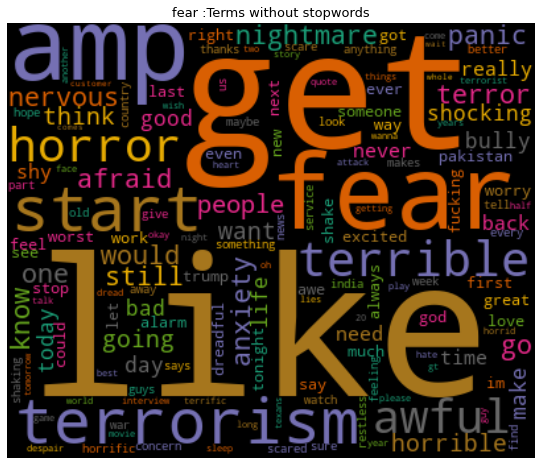

In [319]:
generate_wordcloud(counts_term_score_fear_wo_stopword_df["freq"].sort_values(ascending=False), 
                   "fear :Terms without stopwords")

#### **plot emotion "joy" column's terms without stopwords by sorting term frequency**
"happy", "amazing" etc. wording suitable for this category, and the unigram issue not impact much.

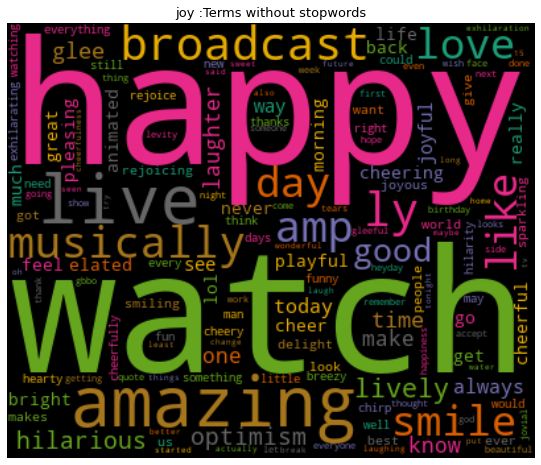

In [320]:
generate_wordcloud(counts_term_score_joy_wo_stopword_df["freq"].sort_values(ascending=False), 
                   "joy :Terms without stopwords")

#### **plot emotion "sadness" column's terms without stopwords by sorting term frequency**
"lost" vs. "get" terms become top 2 most suing words that is suitable for this sad felling. try to "get something" or "lost something" etc. 

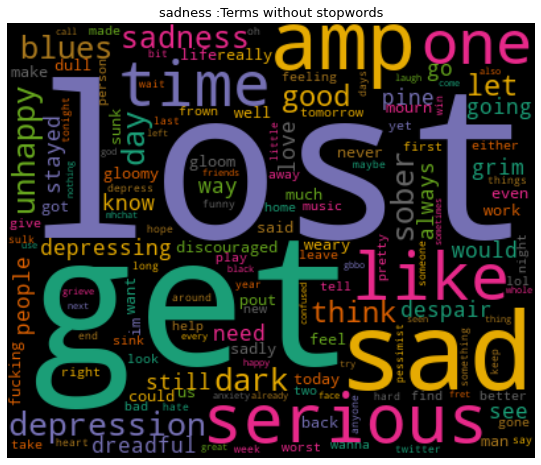

In [321]:
generate_wordcloud(counts_term_score_sadness_wo_stopword_df["freq"].sort_values(ascending=False), 
                   "sadness :Terms without stopwords")

## . TF-IDF features

In [322]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vect = TfidfVectorizer()
df_tfidf = tfidf_vect.fit_transform(train_df.text)

What we did with those two lines of code is that we transorfmed the articles into a **term-document matrix**. Those lines of code tokenize each article using a built-in, default tokenizer (often referred to as an `analzyer`) and then produces the word frequency vector for each document. We can create our own analyzers or even use the nltk analyzer that we previously built. To keep things tidy and minimal we are going to use the default analyzer provided by `TfidfVectorizer`. Let us look closely at this analyzer. 

In [323]:
analyze = count_vect.build_analyzer()
analyze("Hello World!")
#" ".join(list(X[4:5].text))

['hello', 'world']

In [324]:
analyze_tfidf = tfidf_vect.build_analyzer()
analyze_tfidf("Hello World!")
#" ".join(list(X[4:5].text))

['hello', 'world']

---

In [325]:
train_df[0:1]

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords,bin_label,bin_emotion
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...,"[0, 0, 0, 1]","[0, 0, 0, 1]"


In [326]:
# Answer here
analyze_tfidf(train_df['text'][0])

['contactless',
 'affliction',
 'kart',
 'are',
 'the',
 'needs',
 'must',
 'regarding',
 'the',
 'psychological',
 'moment',
 'xbeujgb']

---

Now let us look at the term-document matrix we built above.

In [327]:
# We can check the shape of this matrix by:
df_tfidf.shape

(3613, 10115)

In [328]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
tfidf_vect.get_feature_names()[0:10]

['00', '000', '00pm', '00tiffanyr', '01', '02', '03', '0303', '034', '04']

![alt txt](https://www.researchgate.net/profile/Maryam_Hourali3/publication/306358542/figure/tbl1/AS:648973966651395@1531738859631/Some-Part-of-TF-IDF-Term-Document-Matrix.png)

Above we can see the features found in the all the documents `train_df`, which are basically all the terms found in all the documents. As I said earlier, the transformation is not in the pretty format (table) we saw above -- the term-document matrix. We can do many things with the `tfidf_vect` vectorizer and its transformation `df_idf`. You can find more information on other cool stuff you can do with the [TfidfVectorizer](http://scikit-learn.org/stable/modules/feature_extraction.html#text-feature-extraction). 

Now let us try to obtain something that is as close to the pretty table I provided above. Before jumping into the code for doing just that, it is important to mention that the reason for choosing the `fit_transofrm` for the `CountVectorizer` is that it efficiently learns the vocabulary dictionary and returns a term-document matrix.

In the next bit of code, we want to extract the first five articles and transform them into document-term matrix, or in this case a 2-dimensional array. Here it goes. 

In [329]:
train_df[0:5]

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords,bin_label,bin_emotion
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n...",@ camilluddington fact youre nervous makes wan...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,...",new play tonight ! pretty much blind run . pla...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ...",@ eurekaforbes u got b kidding . anu firm resp...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
4,20313.0,"In addition to fiction, wish me luck on my res...",fear,0.620,1,"[In, addition, to, fiction, ,, wish, me, luck,...","addition fiction , wish luck research paper se...","[0, 1, 0, 0]","[0, 1, 0, 0]"


In [330]:
# we convert from sparse array to normal array
df_tfidf[3, 0:100].toarray()

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.]])

As you can see the result is just this huge sparse matrix, which is computationally intensive to generate and difficult to visualize. But we can see that the 4th record, specifically, contains a `floating number`, which from our feature names we can deduce that this article contains exactly one `45` term.

---

In [331]:
np.where(df_tfidf[3, 0:].toarray() > 0)

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([  601,  1979,  2216,  2461,  2984,  3281,  3488,  3769,  4908,
         5577,  7511,  7952,  8930,  9119,  9782, 10059]))

In [332]:
train_df.text[3]

'@EurekaForbes U got to b kidding me. Anu from your firm responded  when I sent the contact details.  #customerexperience'

In [333]:
# Answer here
idx_1st_term = np.where(df_tfidf[3, 0:].toarray() > 0)[1][0]
print(f'the word of this 1 represents from the vocabulary is: \
{tfidf_vect.get_feature_names()[idx_1st_term]}')

the word of this 1 represents from the vocabulary is: anu


---

We can also use the vectorizer to generate word frequency vector for new documents or articles. Let us try that below:

In [334]:
tfidf_vect.transform(['Something completely new.']).toarray()

array([[0., 0., 0., ..., 0., 0., 0.]])

Now let us put a `00` in the document to see if it is detected as we expect. 

In [335]:
tfidf_vect.transform(['00 Something completely new.']).toarray()

array([[0.60848633, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

## . Naive Bayes classifier
Implement a simple Naive Bayes classifier that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences. Refer to this article.

### **>>> note of result**
According to K-fold results, the both TFIDF and Term Frequency at aive Bayes classifiers both perform similar performance. PRF all above 80%, so the small volume and simple sentence dataset can be classified well by both features without not much different.

In [336]:
train_df.head()

,id,text,emotion,intensity,label,unigrams,text_wo_stopwords,bin_label,bin_emotion
0,40548.0,Contactless affliction kart are the needs must...,sadness,0.375,3,"[Contactless, affliction, kart, are, the, need...",contactless affliction kart needs must regardi...,"[0, 0, 0, 1]","[0, 0, 0, 1]"
1,20080.0,@camilluddington the fact that YOURE nervous m...,fear,0.812,1,"[@, camilluddington, the, fact, that, YOURE, n...",@ camilluddington fact youre nervous makes wan...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
2,20446.0,New play through tonight! Pretty much a blind ...,fear,0.542,1,"[New, play, through, tonight, !, Pretty, much,...",new play tonight ! pretty much blind run . pla...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
3,20716.0,@EurekaForbes U got to b kidding me. Anu from ...,fear,0.417,1,"[@, EurekaForbes, U, got, to, b, kidding, me, ...",@ eurekaforbes u got b kidding . anu firm resp...,"[0, 1, 0, 0]","[0, 1, 0, 0]"
4,20313.0,"In addition to fiction, wish me luck on my res...",fear,0.620,1,"[In, addition, to, fiction, ,, wish, me, luck,...","addition fiction , wish luck research paper se...","[0, 1, 0, 0]","[0, 1, 0, 0]"


In [337]:
# performance output function
def PerformanceOutput(expected, predicted):
    print(metrics.classification_report(expected, predicted))
    print("Marco-AVG    PRF: {:0.3f}, {:0.3f}, {:0.3f}".format(
        metrics.precision_score(expected, predicted, average = "macro"),
        metrics.recall_score(expected, predicted, average = "macro"),
        metrics.f1_score(expected, predicted, average = "macro")))
    
    print("Micro-AVG    PRF: {:0.3f}, {:0.3f}, {:0.3f}".format(
        metrics.precision_score(expected, predicted, average = "micro"),
        metrics.recall_score(expected, predicted, average = "micro"),
        metrics.f1_score(expected, predicted, average = "micro")))
    
    print("Weighted-AVG PRF: {:0.3f}, {:0.3f}, {:0.3f}".format(
        metrics.precision_score(expected, predicted, average = "weighted"),
        metrics.recall_score(expected, predicted, average = "weighted"),
        metrics.f1_score(expected, predicted, average = "weighted")))
    
    print(f"\nConfusion Matrix\n{metrics.confusion_matrix(expected, predicted)}")

### **>>> K-fold**: by original sentence
Since we only have 3613 data records, and just try to compare 2 classifiers by TF-IDF features and word frequency features, we will use K-fold but not restrict to static train data and test data.

In [338]:
from sklearn.model_selection import KFold
from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve

classifier_nb_tfidf = ComplementNB()
classifier_nb_count = ComplementNB()

kf = KFold(n_splits = 10, shuffle = True)

tfidf_vectorizer = TfidfVectorizer()
count_vectorizer = CountVectorizer()

expected_nb_tfidf = []
predicted_nb_tfidf = []
expected_nb_count = []
predicted_nb_count = []

for train_index, test_index in kf.split(train_df.index):
    train_data = train_df.iloc[train_index]
    test_data = train_df.iloc[test_index]
    y_train = train_data.label.values
    y_test = test_data.label.values
    
    # TF-IDF
    x_train_tfidf = tfidf_vectorizer.fit_transform(train_data.text)
    x_test_tfidf = tfidf_vectorizer.transform(test_data.text)
    classifier_nb_tfidf.fit(x_train_tfidf, y_train)
    # make predicitions
    expected_nb_tfidf.extend(y_test)
    predicted_nb_tfidf.extend(classifier_nb_tfidf.predict(x_test_tfidf))
    
    # Term Frequency
    x_train_count = count_vectorizer.fit_transform(train_data.text)
    x_test_count = count_vectorizer.transform(test_data.text)
    classifier_nb_count.fit(x_train_count, y_train)
    # make predicitions
    expected_nb_count.extend(y_test)
    predicted_nb_count.extend(classifier_nb_count.predict(x_test_count))

# make predictions: TFIDF
print(f'{"TFIDF Performance":=^60}\n')
PerformanceOutput(expected_nb_tfidf, predicted_nb_tfidf)

# make predictions: Term Counts
print(f'\n{"Term Counts Performance":=^60}\n')
PerformanceOutput(expected_nb_count, predicted_nb_count)


=====================TFIDF Performance======================

              precision    recall  f1-score   support

           0       0.88      0.87      0.87       857
           1       0.85      0.92      0.88      1147
           2       0.92      0.91      0.92       823
           3       0.84      0.76      0.80       786

    accuracy                           0.87      3613
   macro avg       0.87      0.86      0.87      3613
weighted avg       0.87      0.87      0.87      3613

Marco-AVG    PRF: 0.871, 0.865, 0.867
Micro-AVG    PRF: 0.870, 0.870, 0.870
Weighted-AVG PRF: 0.870, 0.870, 0.869

Confusion Matrix
[[ 743   44   16   54]
 [  34 1050   18   45]
 [  10   42  752   19]
 [  56   97   34  599]]

==================Term Counts Performance===================

              precision    recall  f1-score   support

           0       0.87      0.89      0.88       857
           1       0.89      0.89      0.89      1147
           2       0.91      0.94      0.92       82

### **>>> K-fold**: by sentence without stopwords
Since we only have 3613 data records, and just try to compare 2 classifiers by TF-IDF features and word frequency features, we will use K-fold but not restrict to static train data and test data.

In [339]:
from sklearn.model_selection import KFold
from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve

classifier_nb_tfidf = ComplementNB()
classifier_nb_count = ComplementNB()
kf = KFold(n_splits = 10, shuffle = True)
tfidf_vectorizer = TfidfVectorizer()
count_vectorizer = CountVectorizer()

expected_nb_tfidf = []
predicted_nb_tfidf = []
expected_nb_count = []
predicted_nb_count = []

for train_index, test_index in kf.split(train_df.index):
    train_data = train_df.loc[train_index]
    test_data = train_df.loc[test_index]
    y_train = train_data.label.values
    y_test = test_data.label.values
    
    # TF-IDF
    x_train_tfidf = tfidf_vectorizer.fit_transform(train_data.text_wo_stopwords)
    x_test_tfidf = tfidf_vectorizer.transform(test_data.text_wo_stopwords)
    classifier_nb_tfidf.fit(x_train_tfidf, y_train)
    # make predicitions
    expected_nb_tfidf.extend(y_test)
    predicted_nb_tfidf.extend(classifier_nb_tfidf.predict(x_test_tfidf))
    
    # Term Frequency
    x_train_count = count_vectorizer.fit_transform(train_data.text_wo_stopwords)
    x_test_count = count_vectorizer.transform(test_data.text_wo_stopwords)
    classifier_nb_count.fit(x_train_count, y_train)
    # make predicitions
    expected_nb_count.extend(y_test)
    predicted_nb_count.extend(classifier_nb_count.predict(x_test_count))

# make predictions: TFIDF
print(f'{"TFIDF Performance":=^60}\n')
PerformanceOutput(expected_nb_tfidf, predicted_nb_tfidf)

# make predictions: Term Counts
print(f'\n{"Term Counts Performance":=^60}\n')
PerformanceOutput(expected_nb_count, predicted_nb_count)


=====================TFIDF Performance======================

              precision    recall  f1-score   support

           0       0.88      0.89      0.89       857
           1       0.88      0.91      0.89      1147
           2       0.90      0.92      0.91       823
           3       0.85      0.79      0.82       786

    accuracy                           0.88      3613
   macro avg       0.88      0.88      0.88      3613
weighted avg       0.88      0.88      0.88      3613

Marco-AVG    PRF: 0.880, 0.877, 0.878
Micro-AVG    PRF: 0.881, 0.881, 0.881
Weighted-AVG PRF: 0.880, 0.881, 0.880

Confusion Matrix
[[ 760   34   20   43]
 [  33 1042   24   48]
 [  13   35  759   16]
 [  54   72   39  621]]

==================Term Counts Performance===================

              precision    recall  f1-score   support

           0       0.88      0.89      0.89       857
           1       0.89      0.90      0.89      1147
           2       0.89      0.93      0.91       82